In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

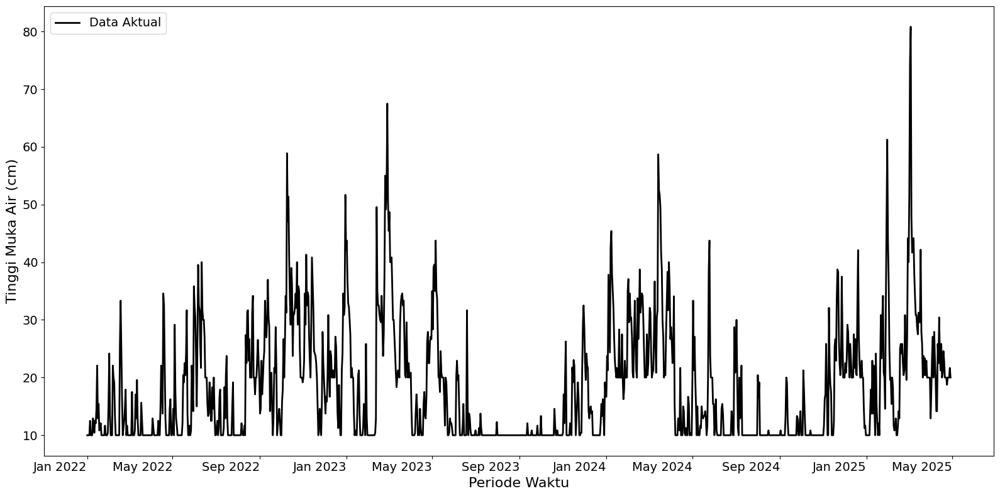

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

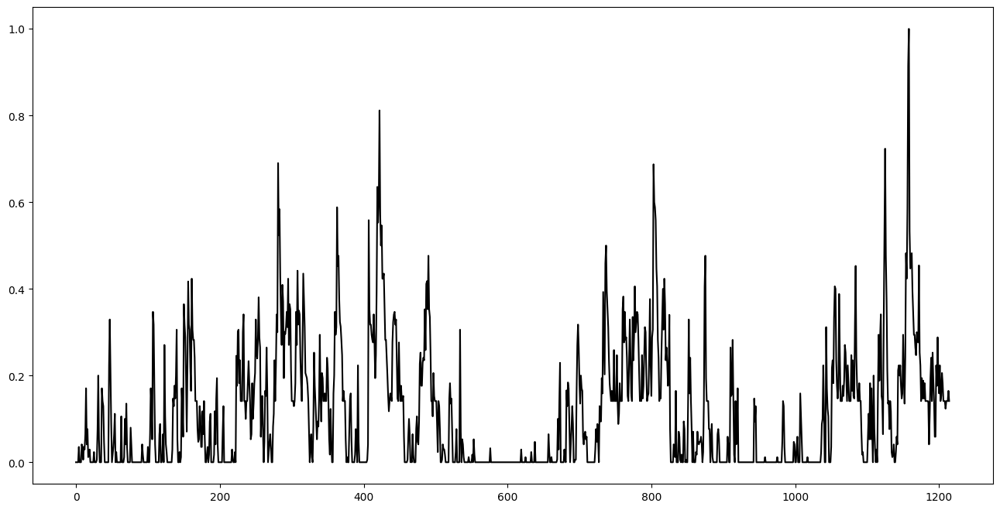

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        16,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Expanding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
89/93 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0061Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


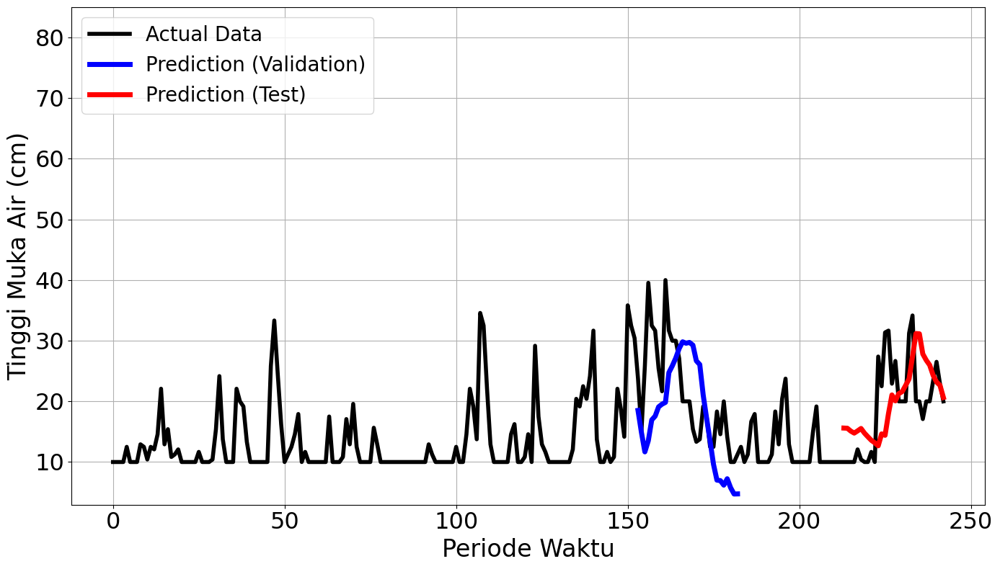

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step

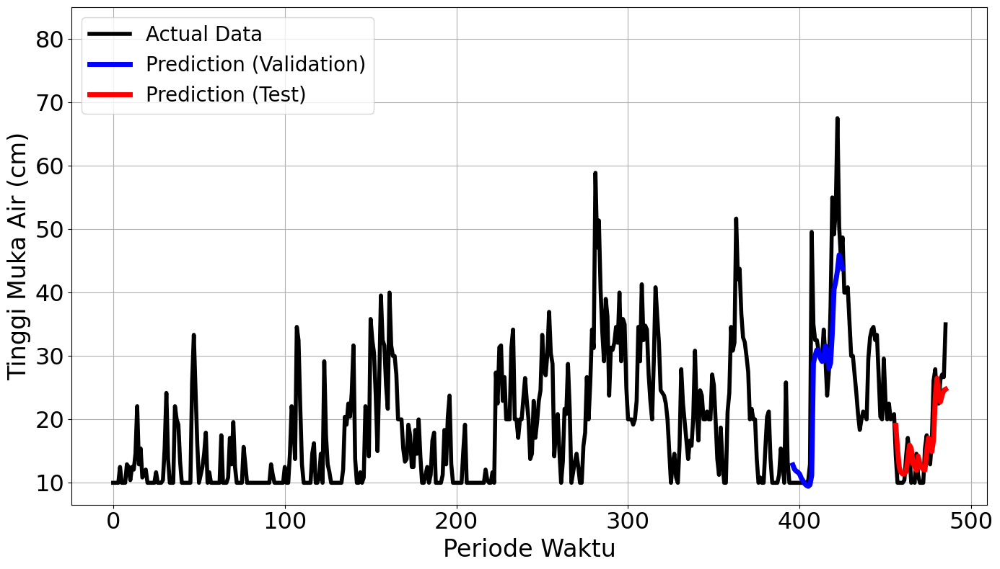

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
576/579 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0070Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


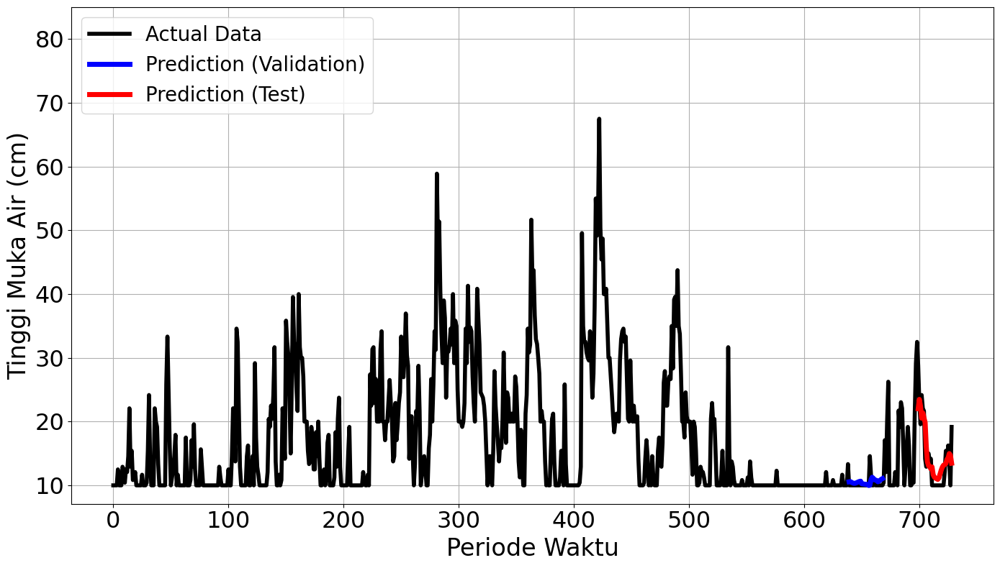

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
818/822 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape va

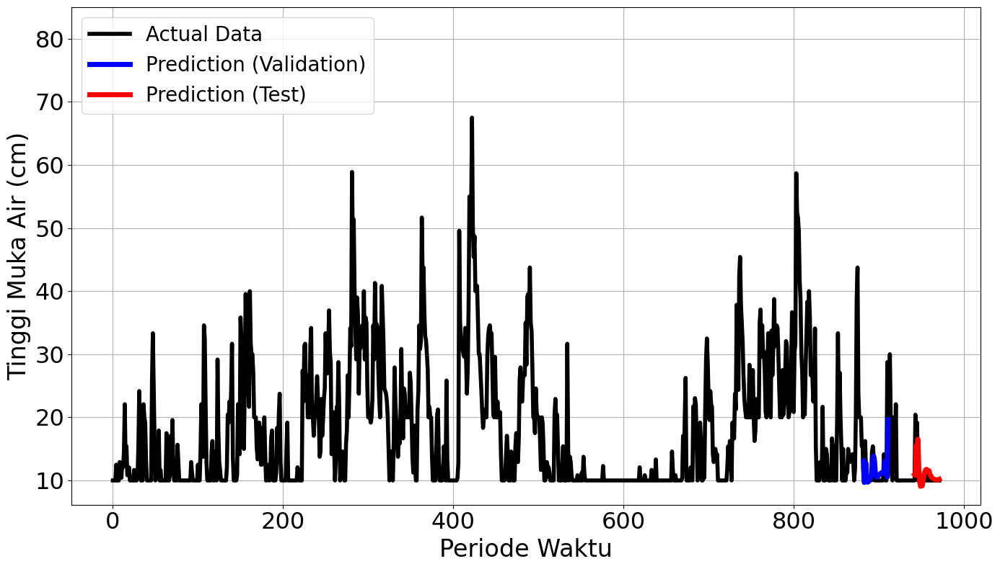

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100
1065/1065 ━━

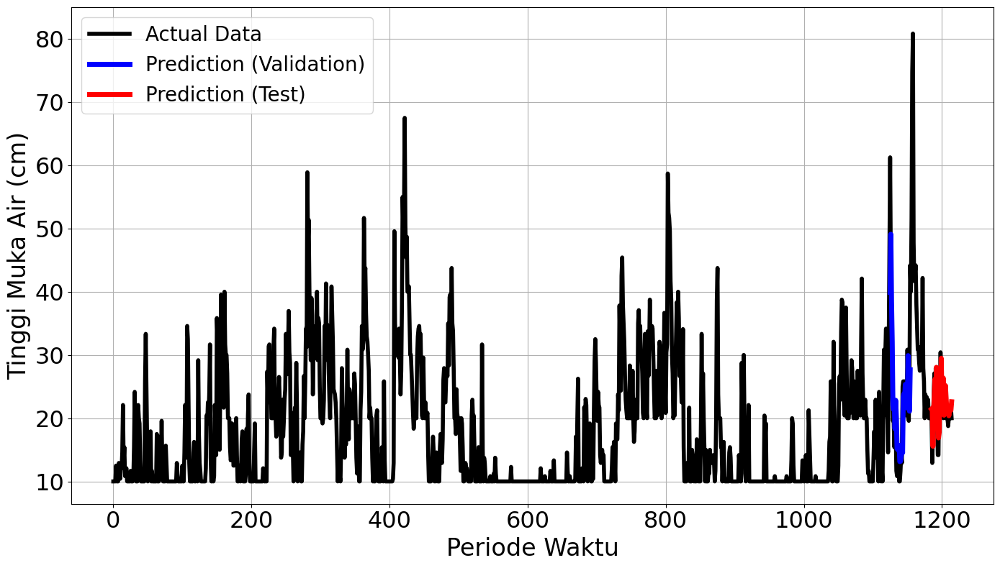

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
88/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0061Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


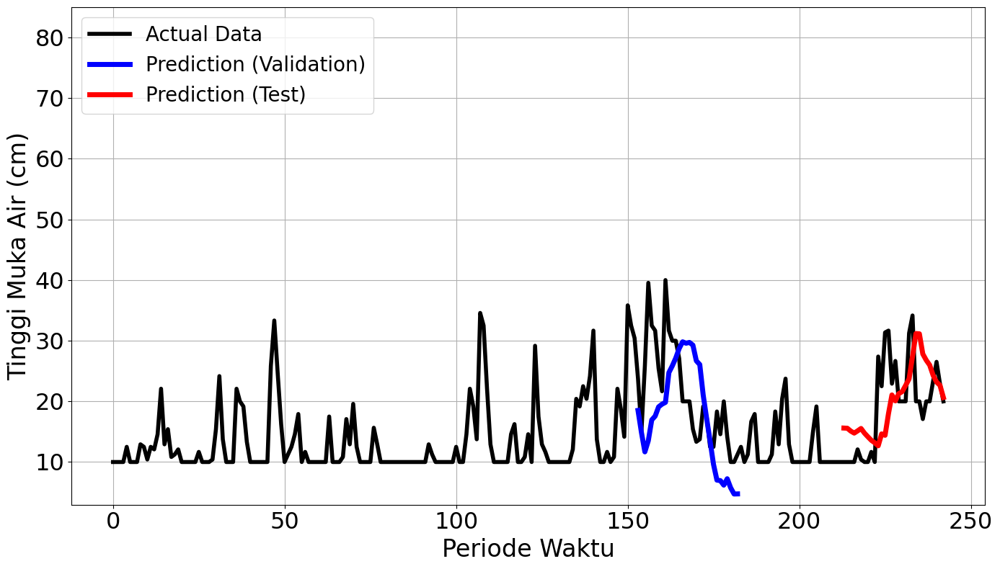

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step

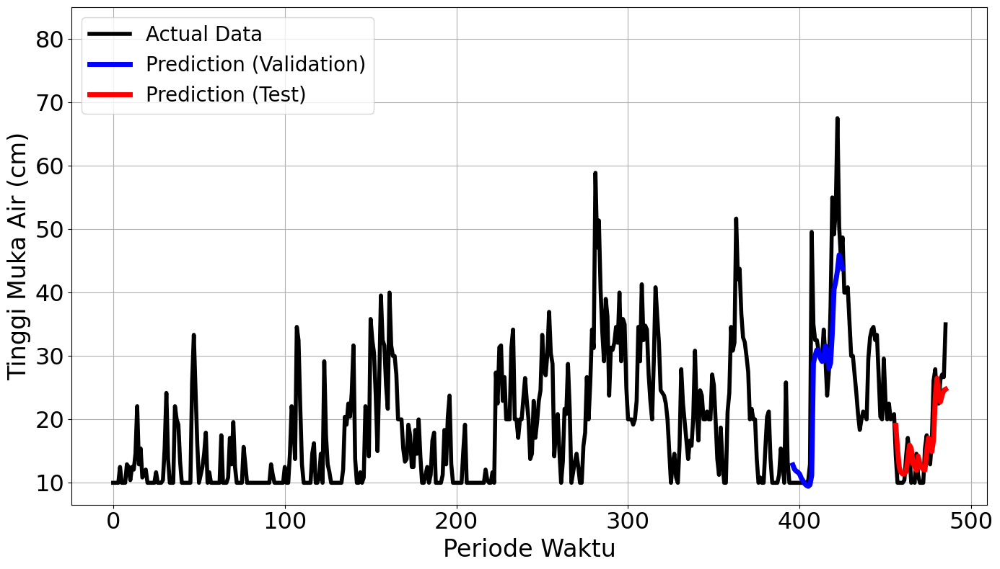

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
576/579 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0070Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


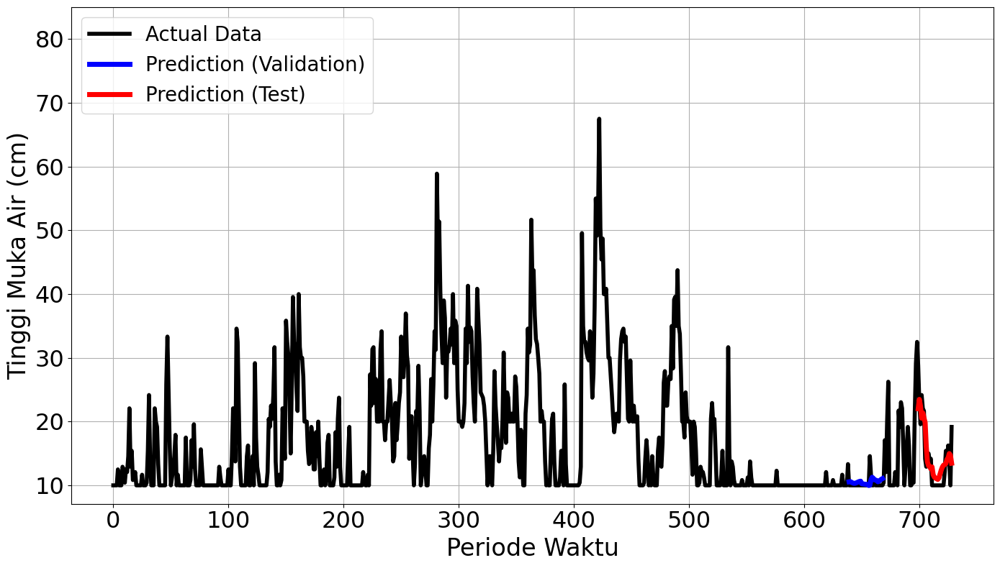

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
819/822 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape val

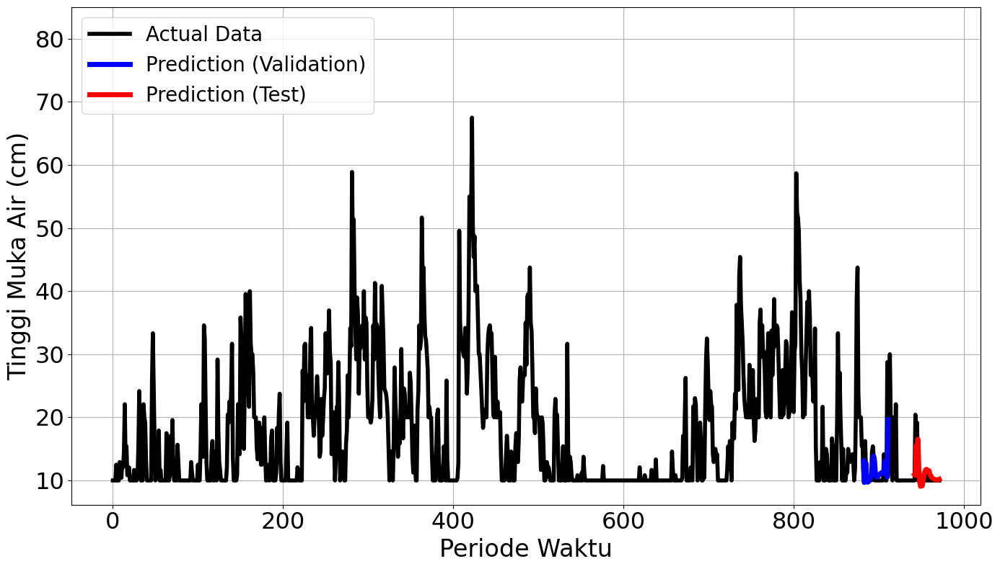

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100
1065/1065 ━━━

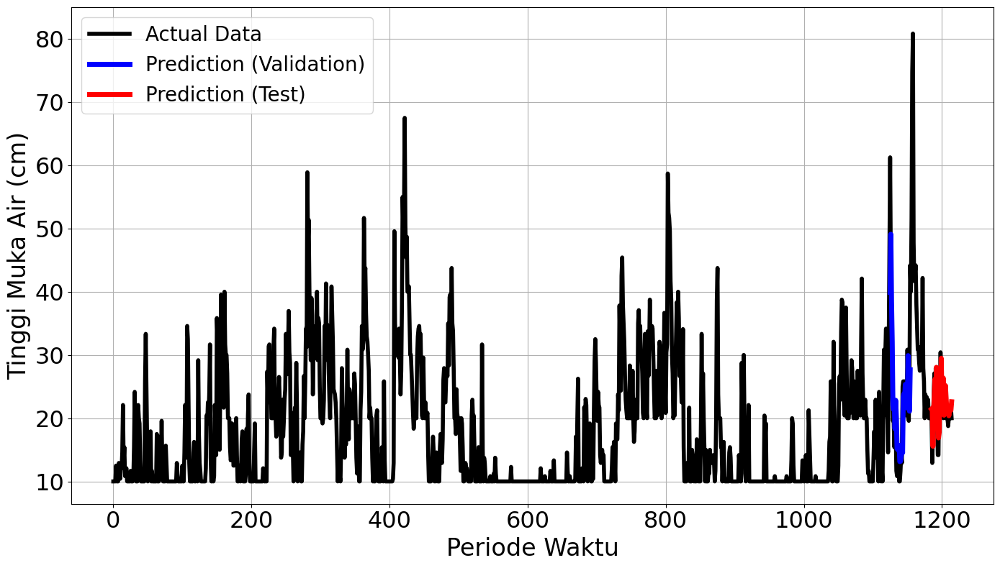

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
89/93 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0061Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


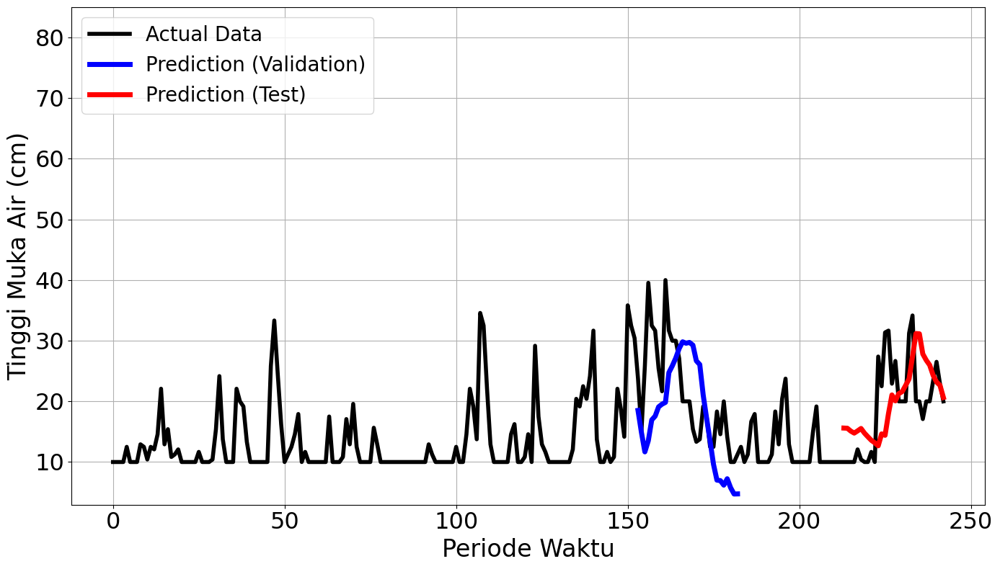

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/st

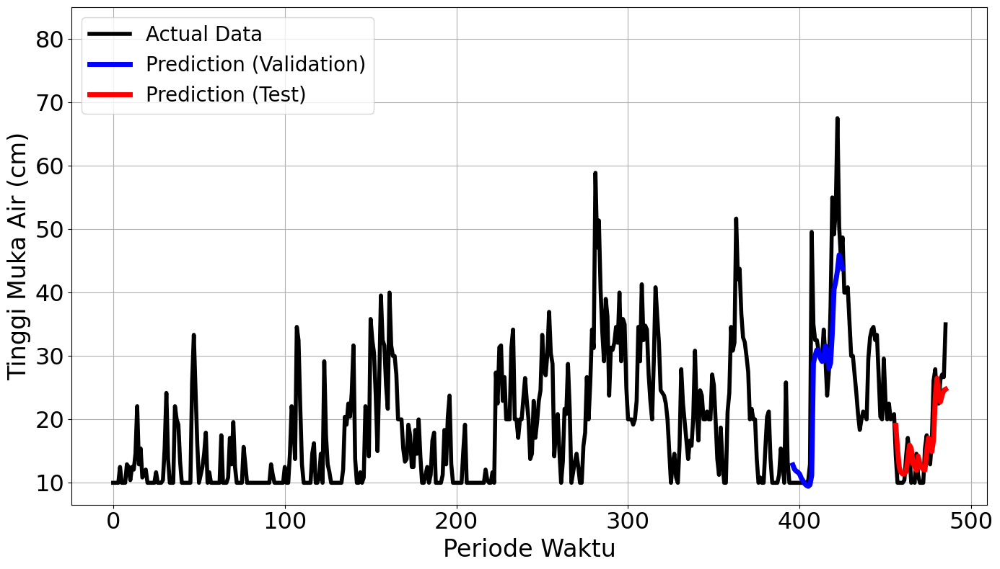

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
576/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0070Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


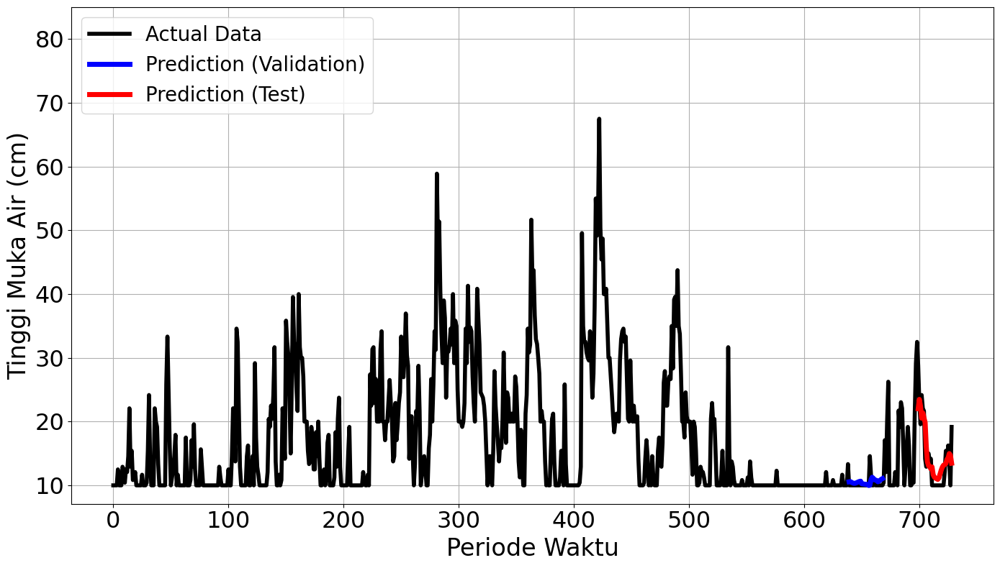

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
816/822 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape valid

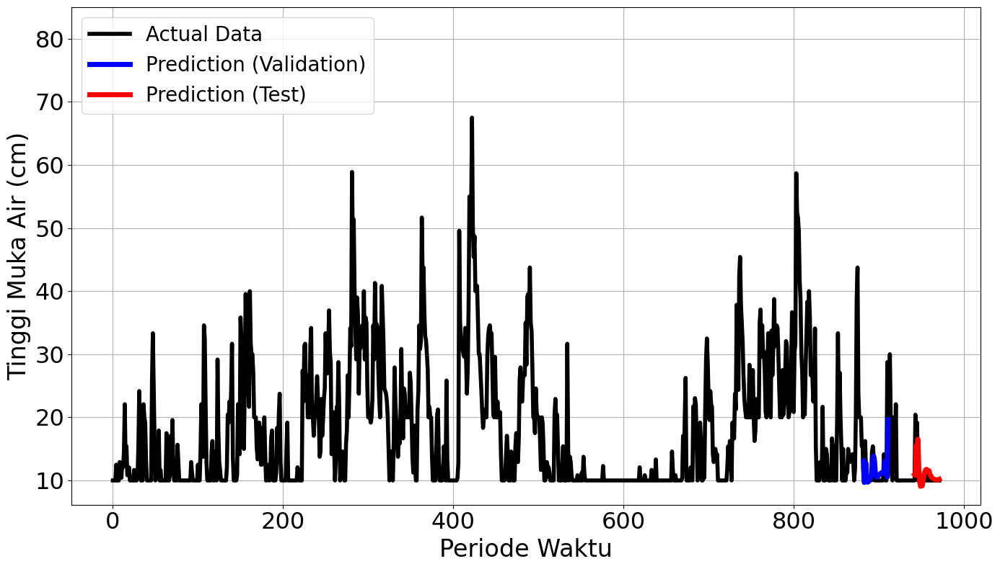

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100
1065/1065 ━

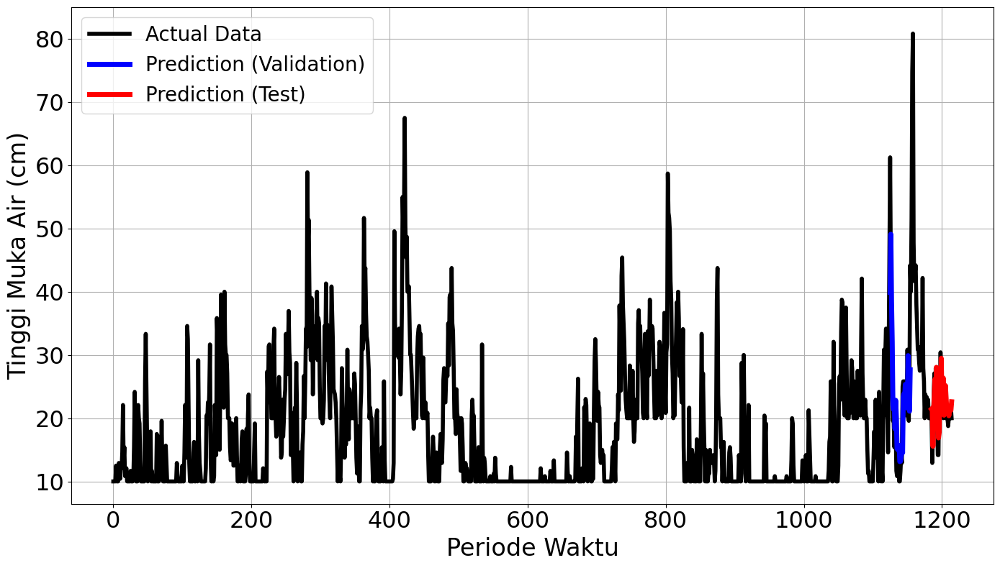

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
88/93 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


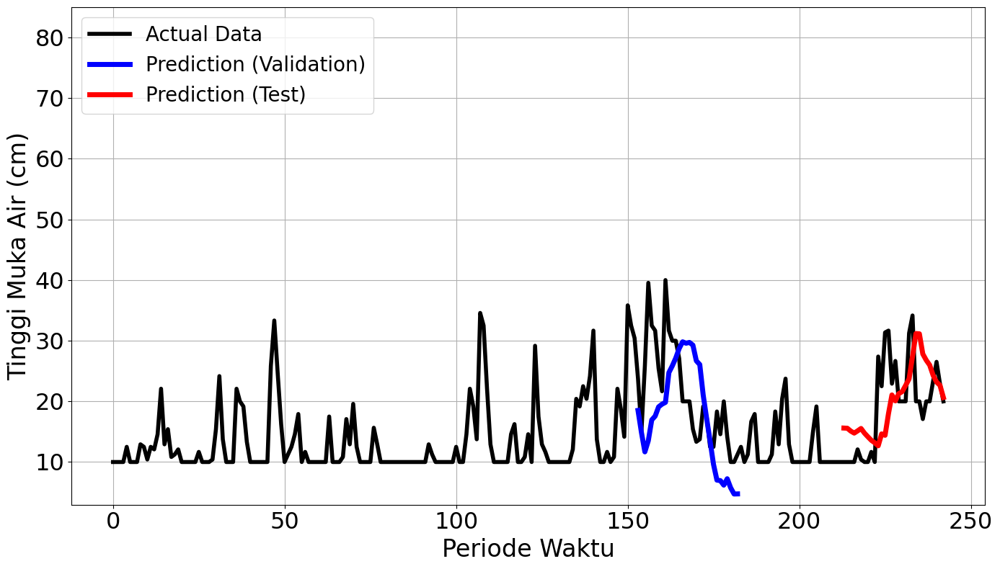

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/st

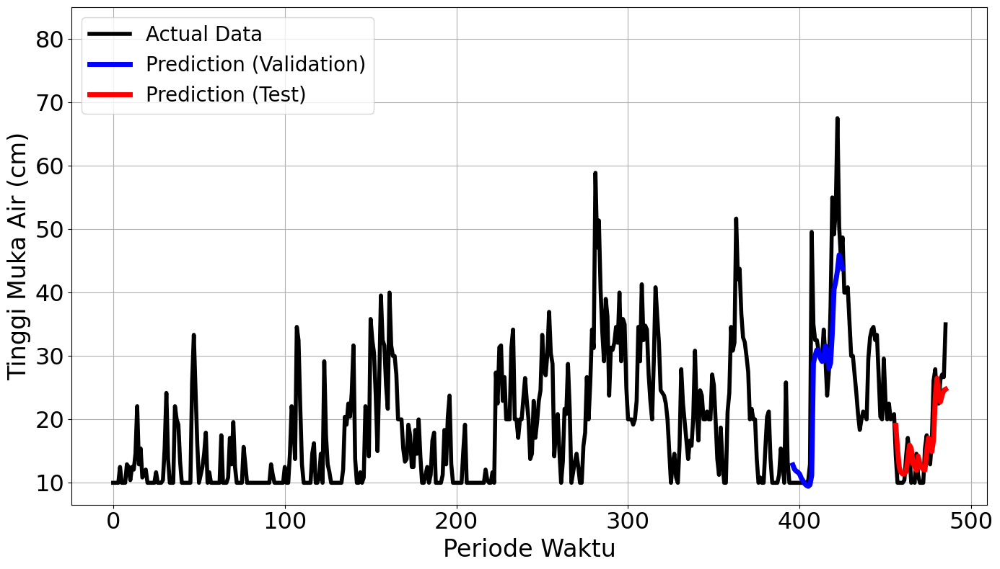

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
573/579 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0070Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


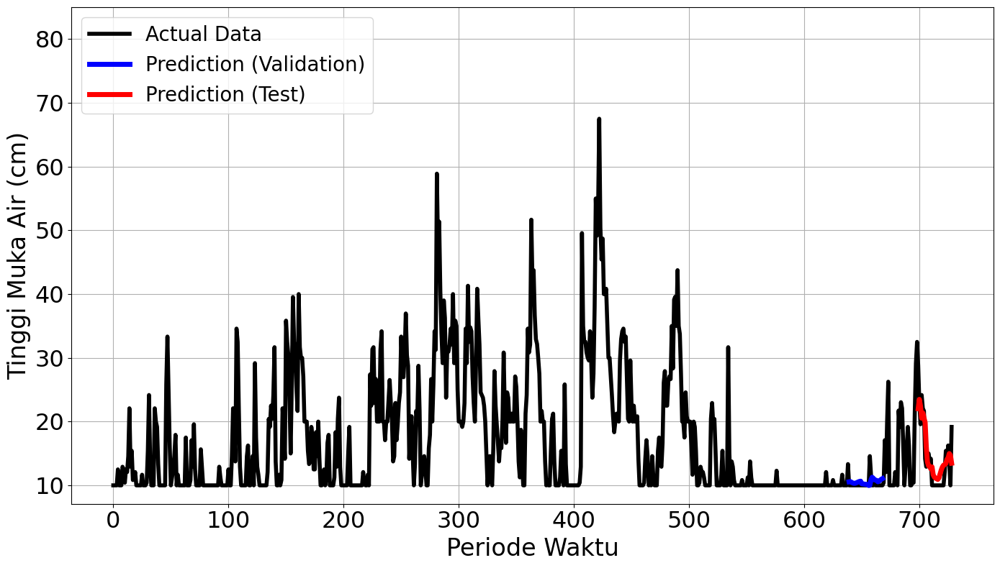

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
816/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape vali

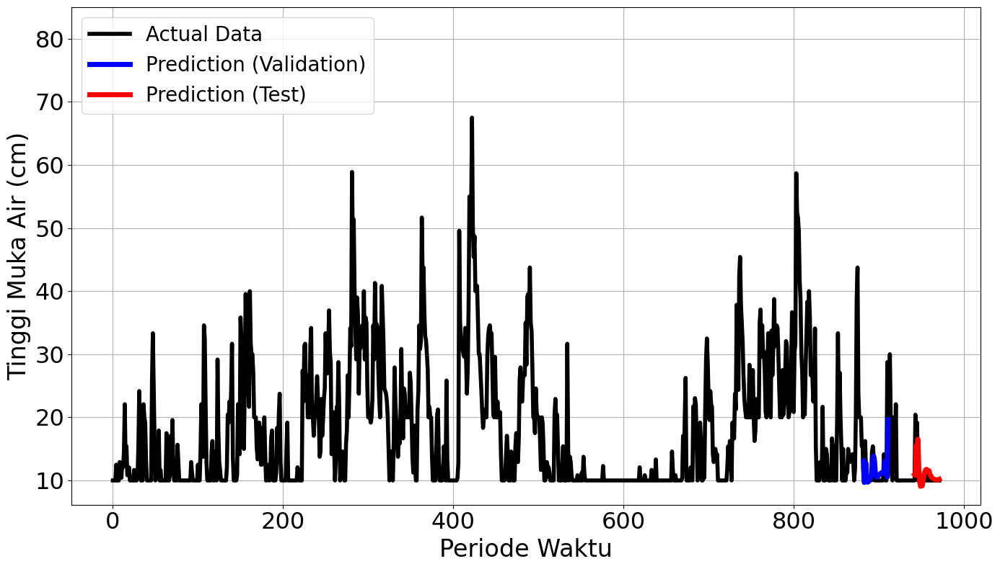

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100
1065/1065

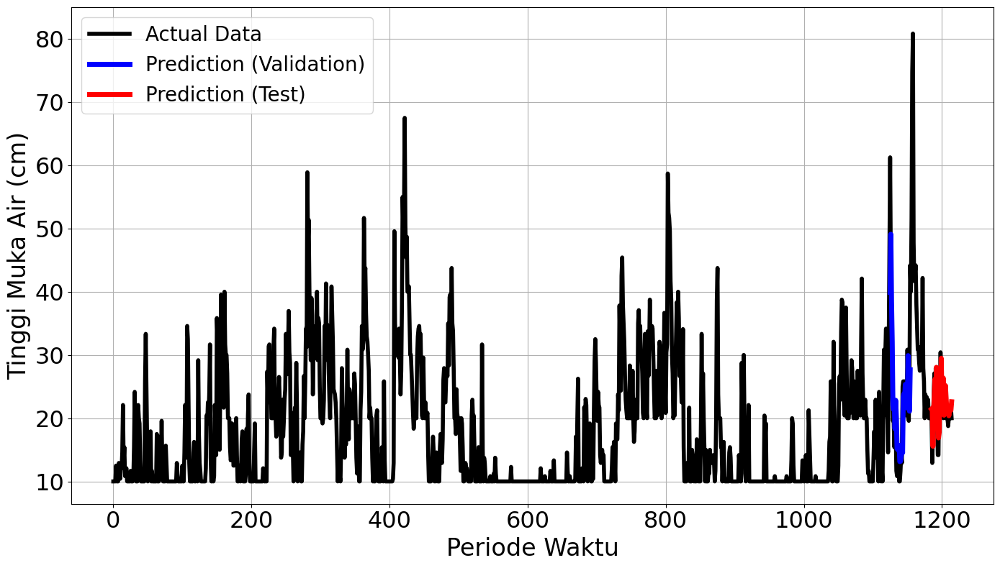

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0060Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


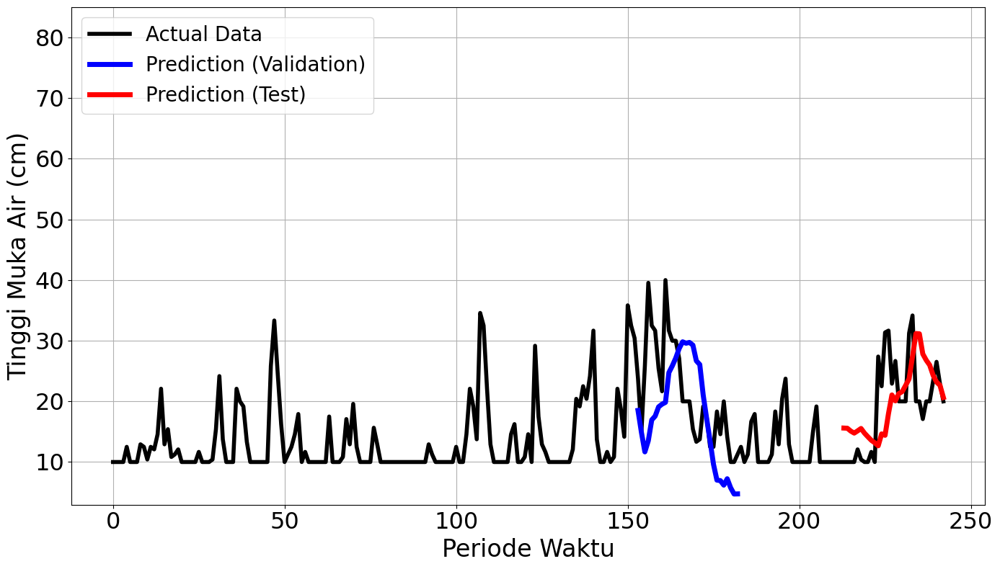

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/s

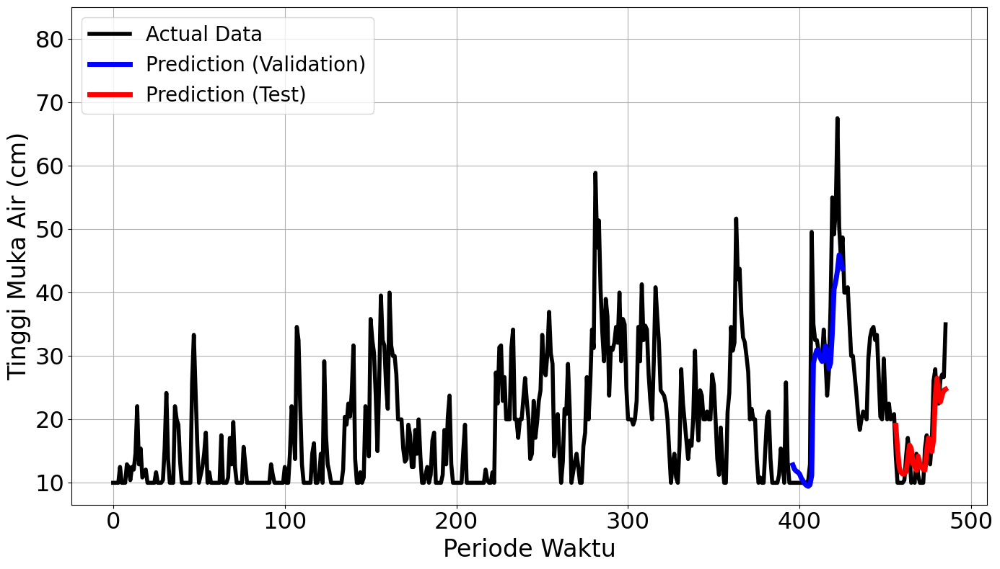

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
575/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0070Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


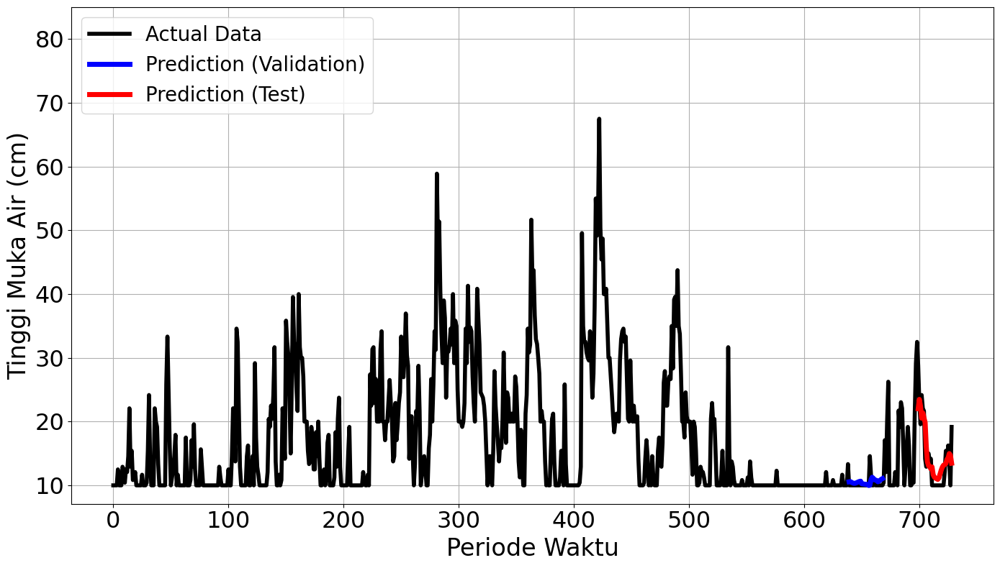

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
819/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape 

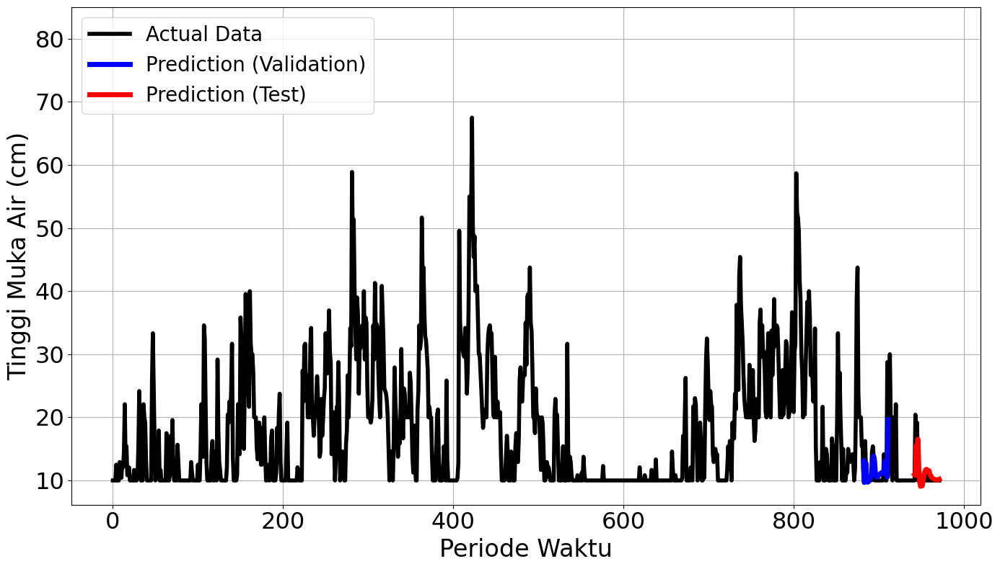

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100
106

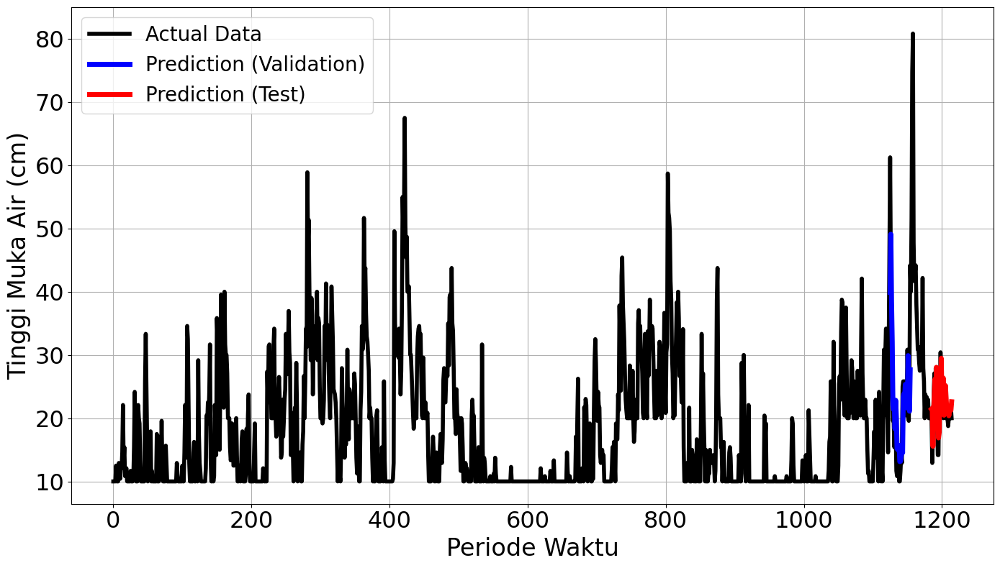

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
88/93 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


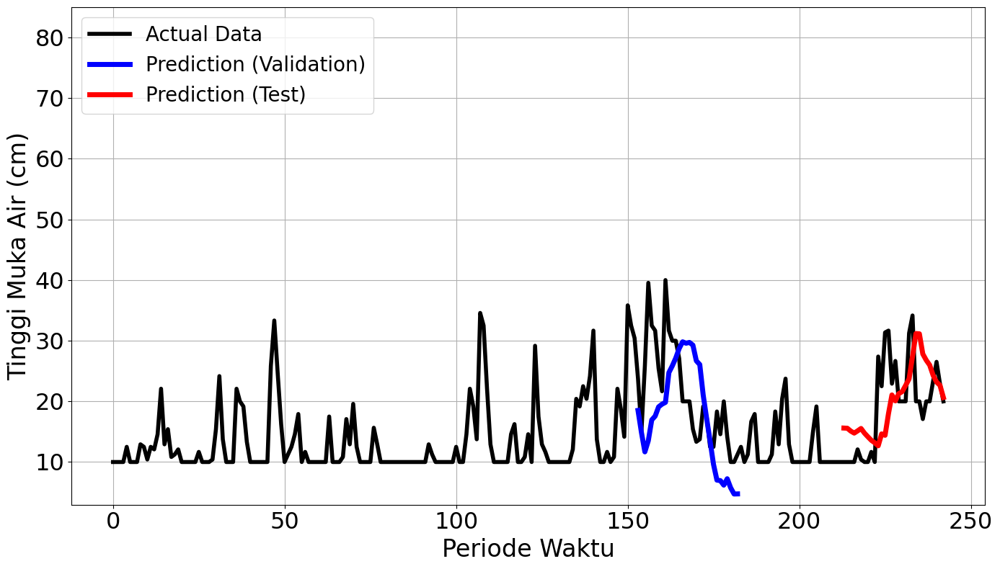

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms

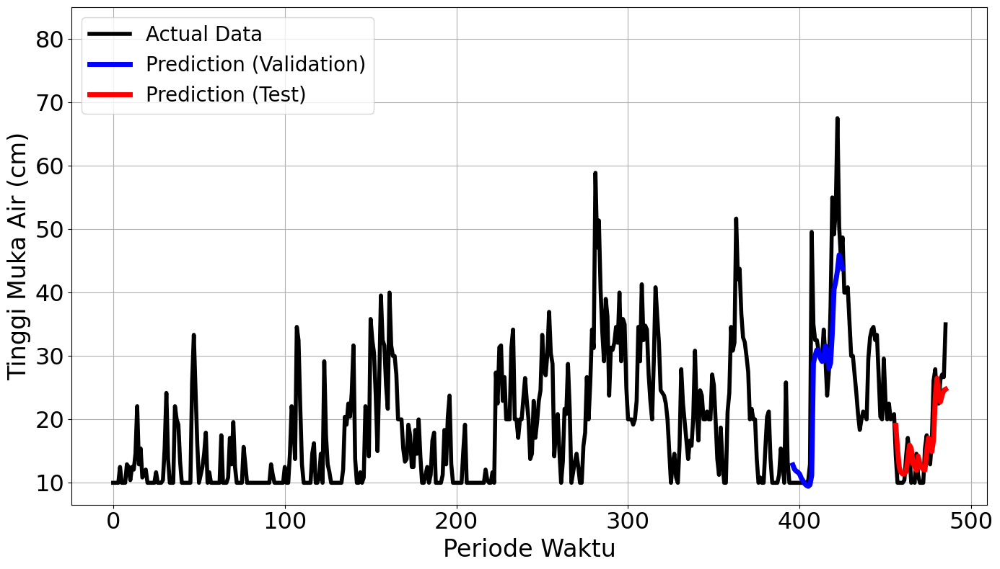

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
577/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0069Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


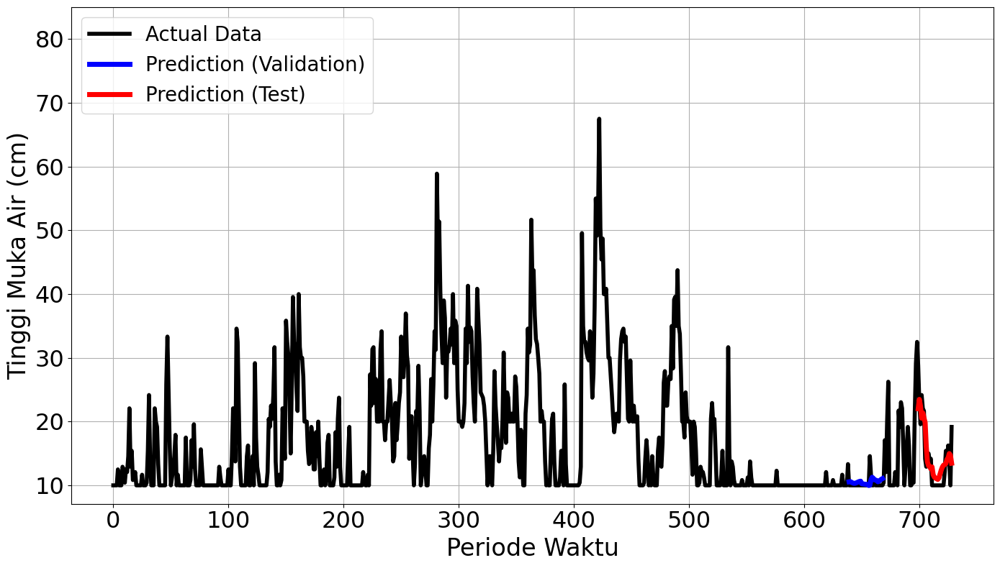

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
816/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


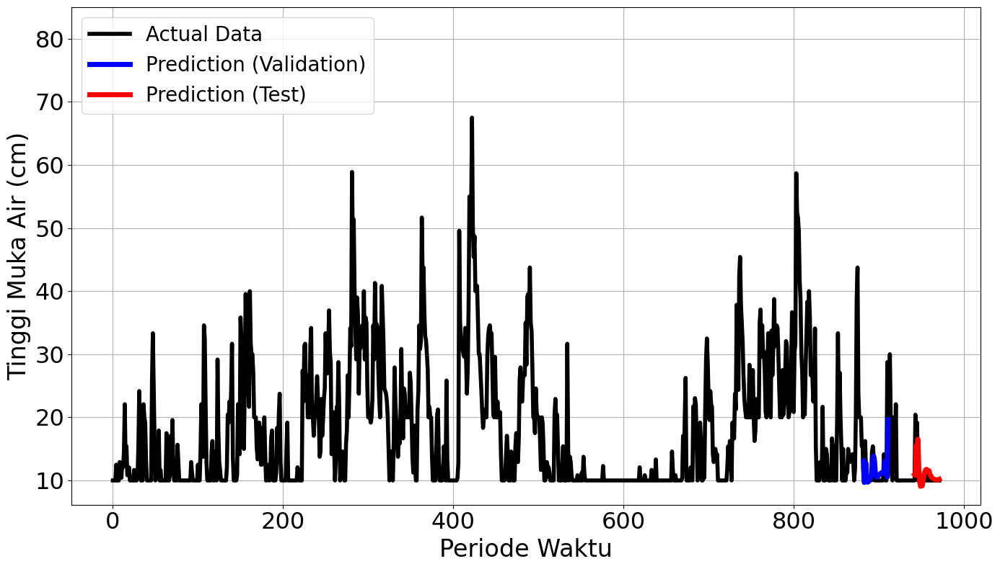

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100


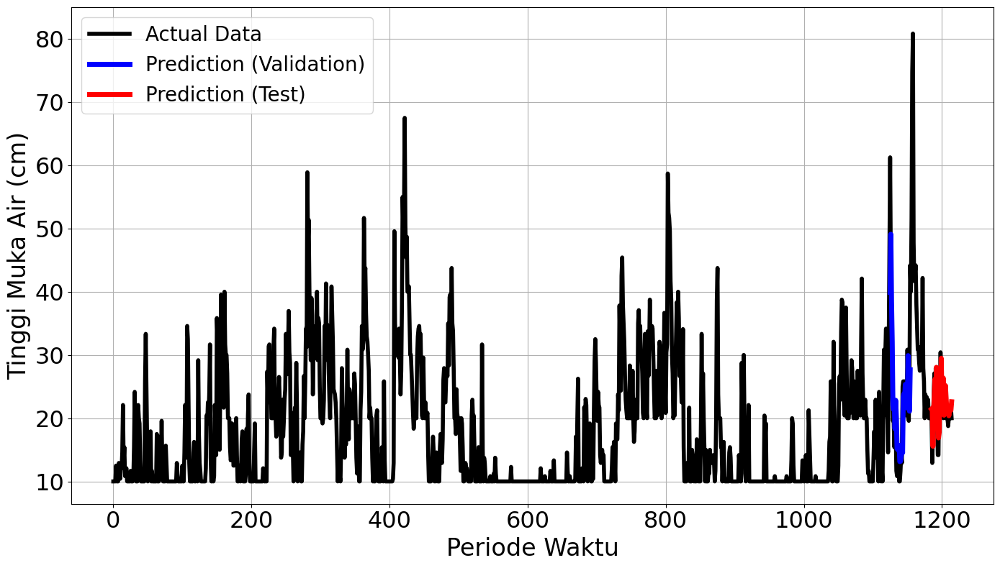

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0060Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


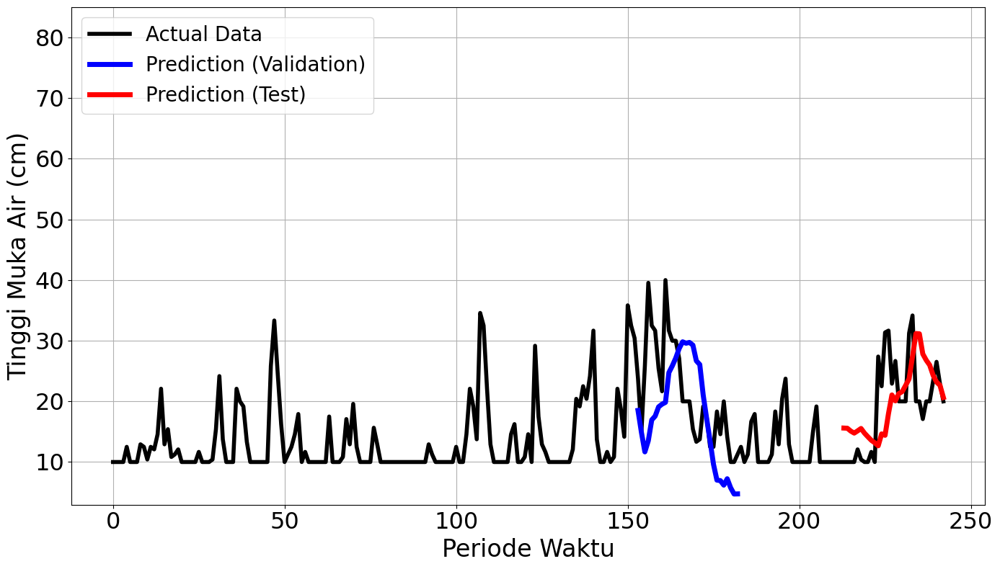

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5

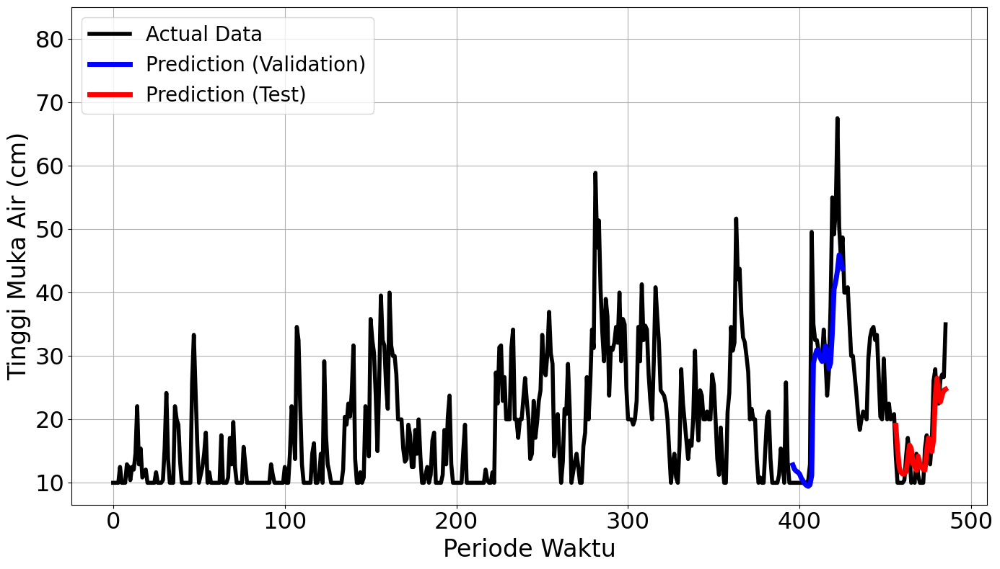

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
574/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0070Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


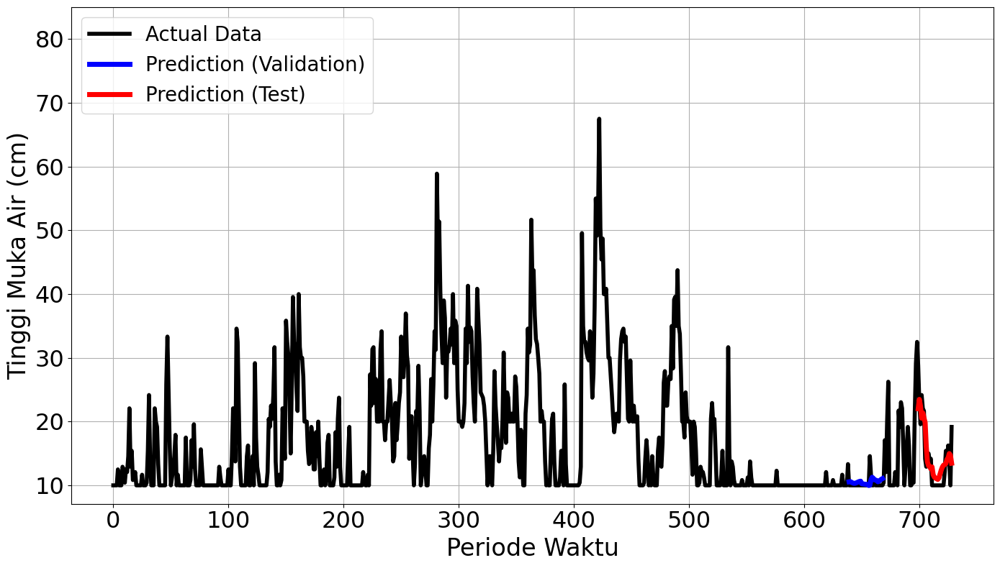

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape

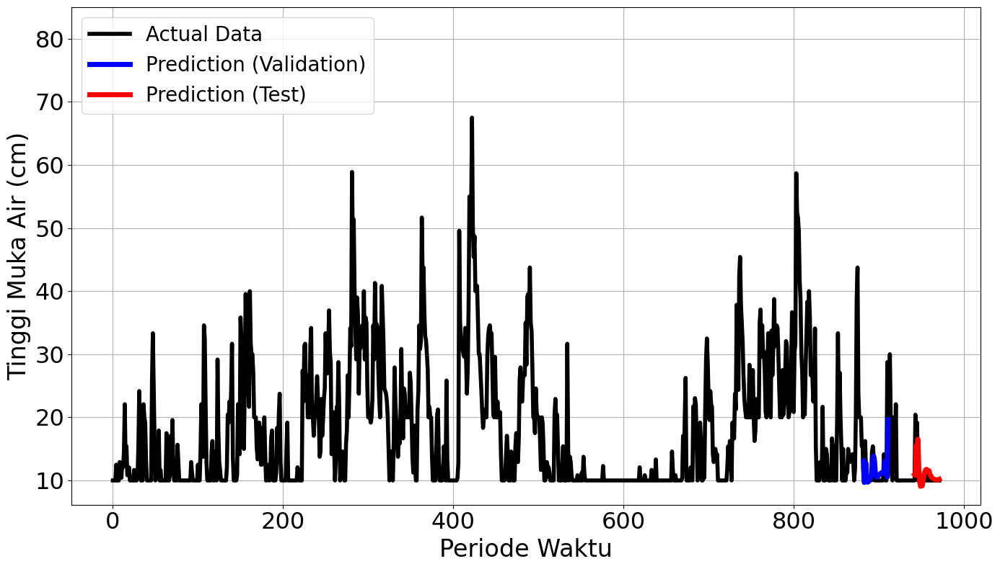

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100


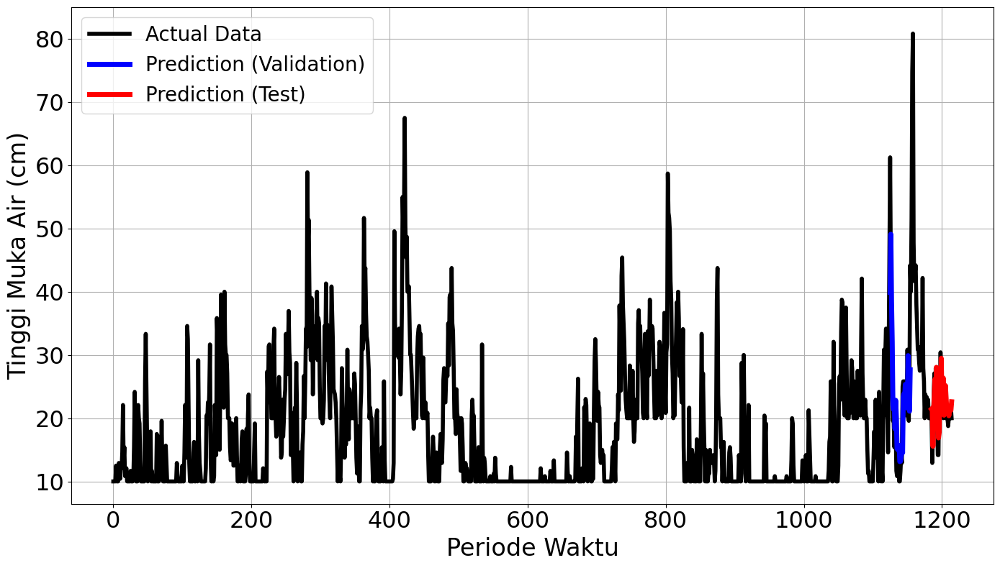

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0517 - val_loss: 0.0213
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0062 - val_loss: 0.0330
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0052 - val_loss: 0.0353
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0104 - val_loss: 0.0561
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0081 - val_loss: 0.0254
Epoch 6/100
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0060Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0060 - val_loss: 0.0380
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 40.84465652408074 %
mape test = 32.385787167938574 %


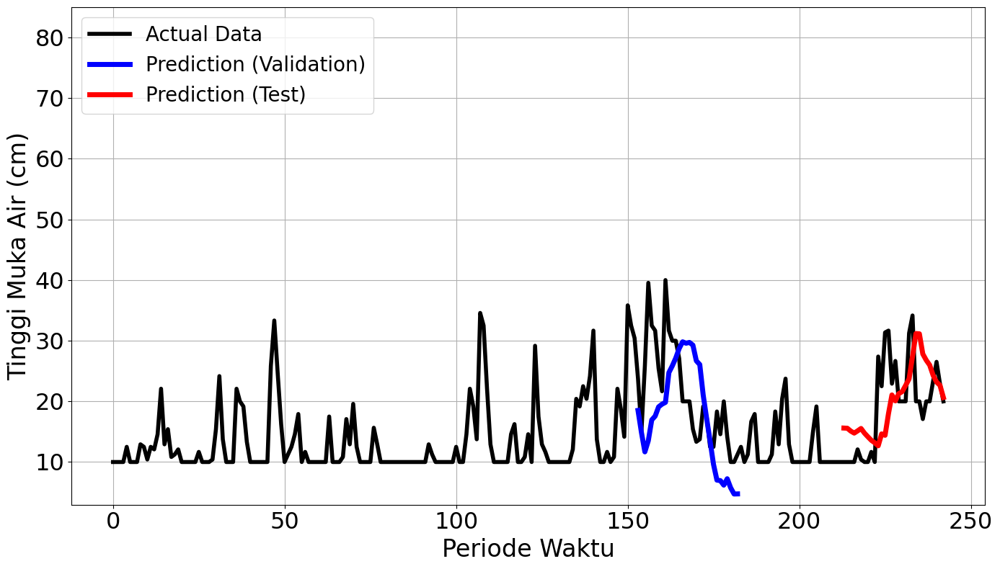

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.0373 - val_loss: 0.0385
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0120 - val_loss: 0.0362
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0096 - val_loss: 0.0231
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0092 - val_loss: 0.0342
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0112 - val_loss: 0.0319
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0078 - val_loss: 0.0288
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0067 - val_loss: 0.0290
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0072 - val_loss: 0.0199
Epoch 10/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0076 - val_loss: 0.0231
Epoch 11/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0078 - val_loss: 0.0232
Epoch 12/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 1

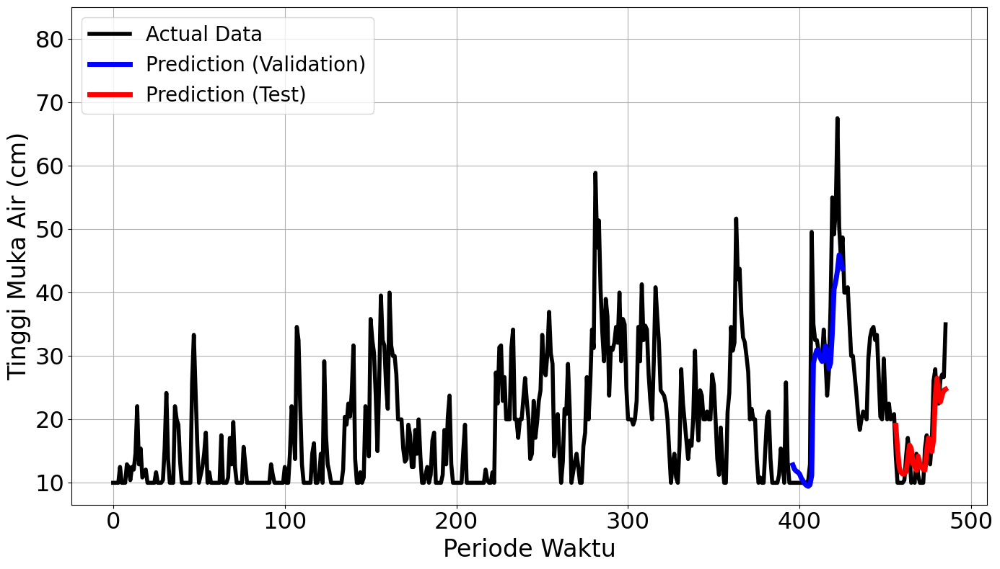

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0242 - val_loss: 6.3601e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0099 - val_loss: 2.1214e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0080 - val_loss: 8.9001e-04
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0070 - val_loss: 3.6566e-04
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0065 - val_loss: 3.4721e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0073 - val_loss: 6.1569e-04
Epoch 7/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0069 Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 8.1357e-04
Epoch 00007: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 6.097407382919682 %
mape test = 16.549310772913344 %


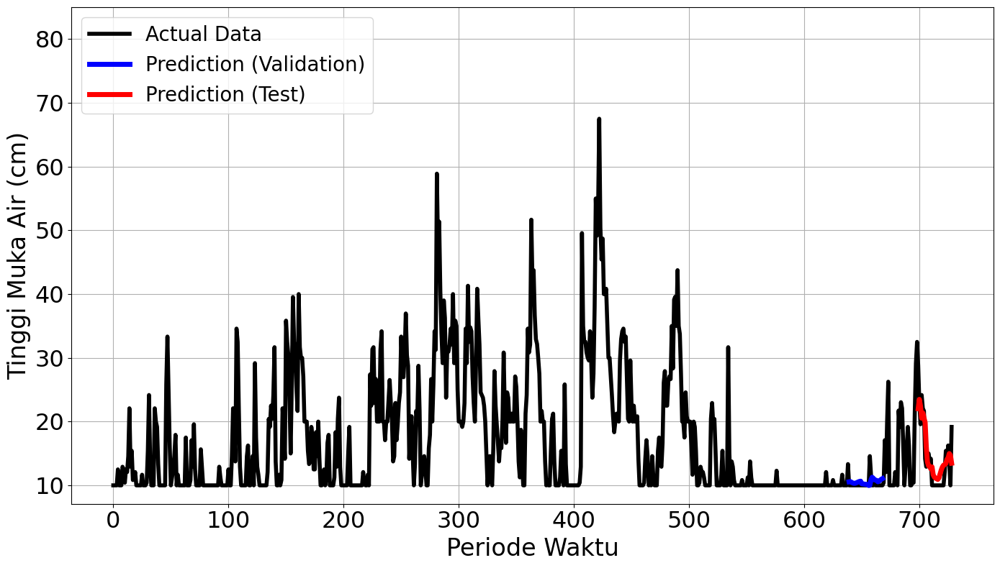

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0249 - val_loss: 0.0032
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0077 - val_loss: 0.0171
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0083 - val_loss: 0.0066
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0030
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0069 - val_loss: 0.0070
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0071 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0067 - val_loss: 0.0043
Epoch 9/100
821/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
m

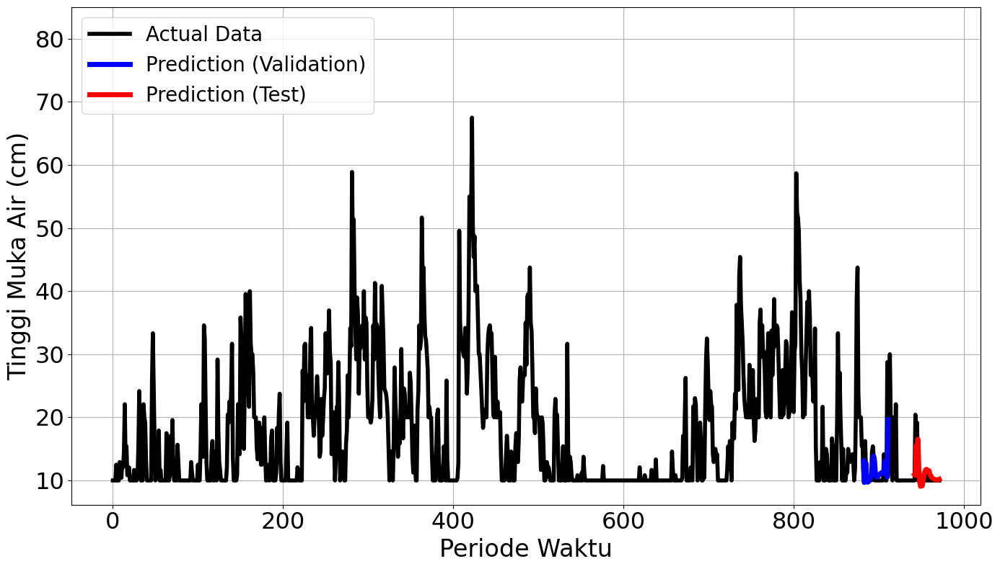

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0076 - val_loss: 0.0131
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0059 - val_loss: 0.0101
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0063 - val_loss: 0.0103
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0057 - val_loss: 0.0111
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0065 - val_loss: 0.0102
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0060 - val_loss: 0.0148
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0056 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0053 - val_loss: 0.0093
Epoch 10/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0062 - val_loss: 0.0091
Epoch 11/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0051 - val_loss: 0.0089
Epoch 12/100

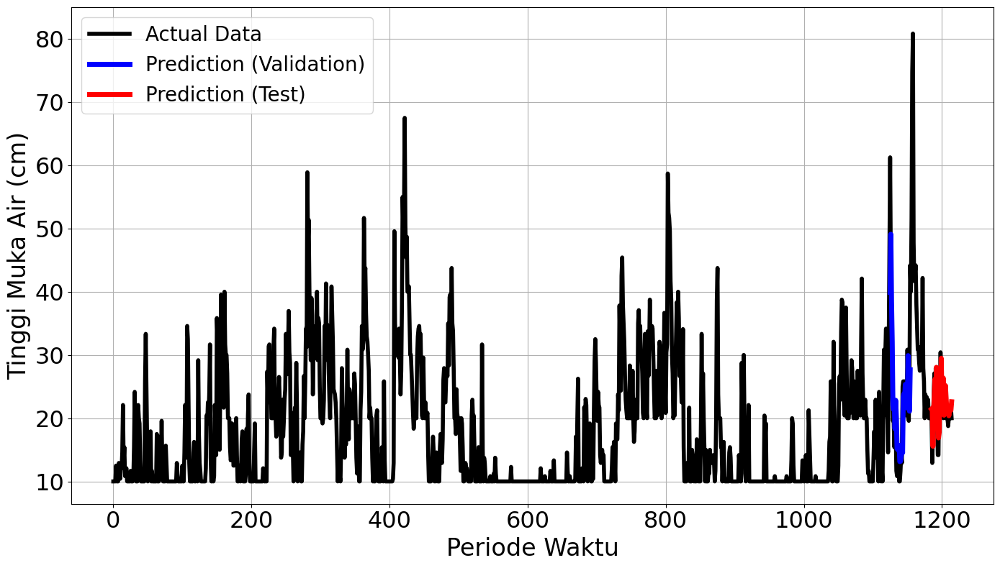

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1987
Final Average MAPE Test: 0.1984
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
89/93 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


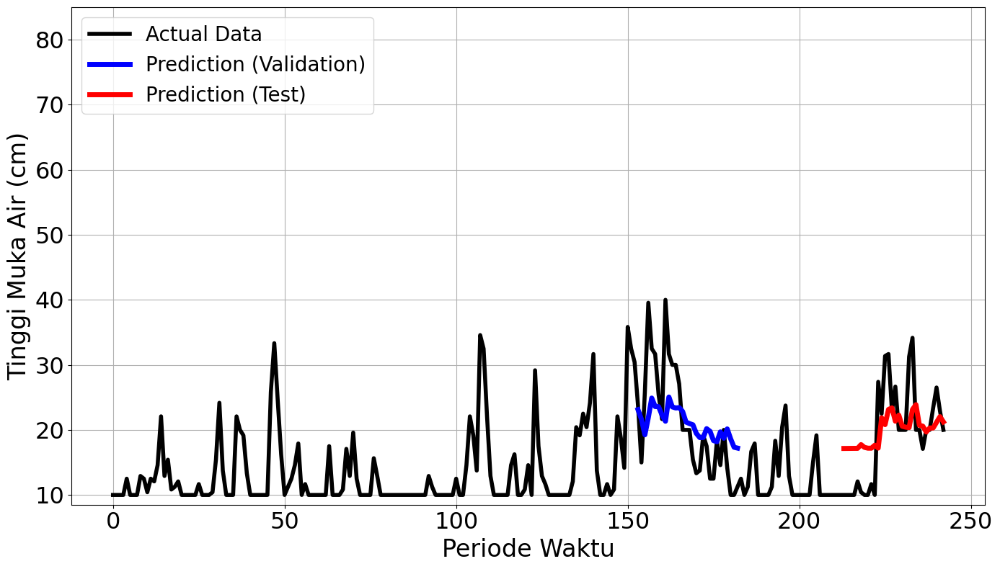

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
332/336 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
map

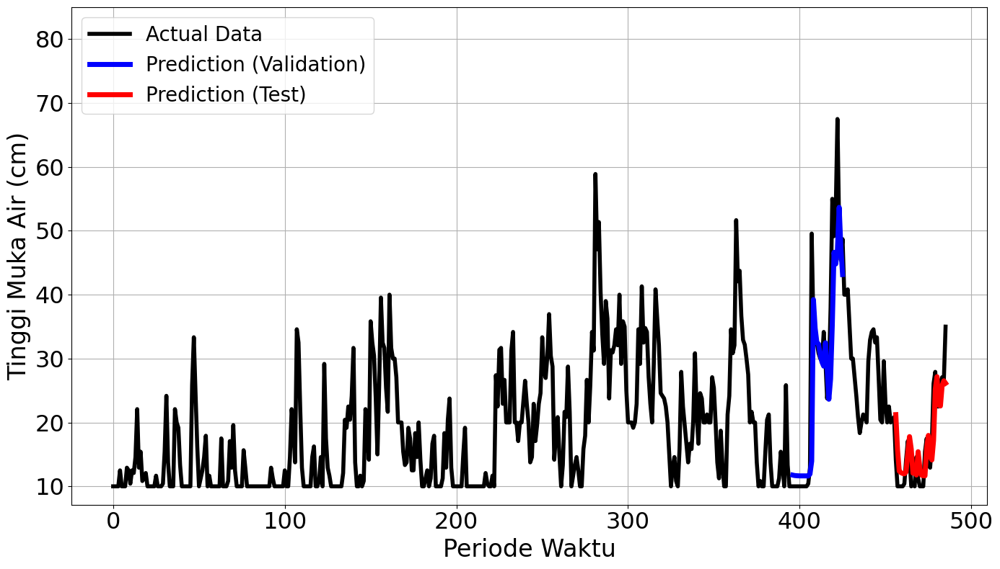

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
575/579 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


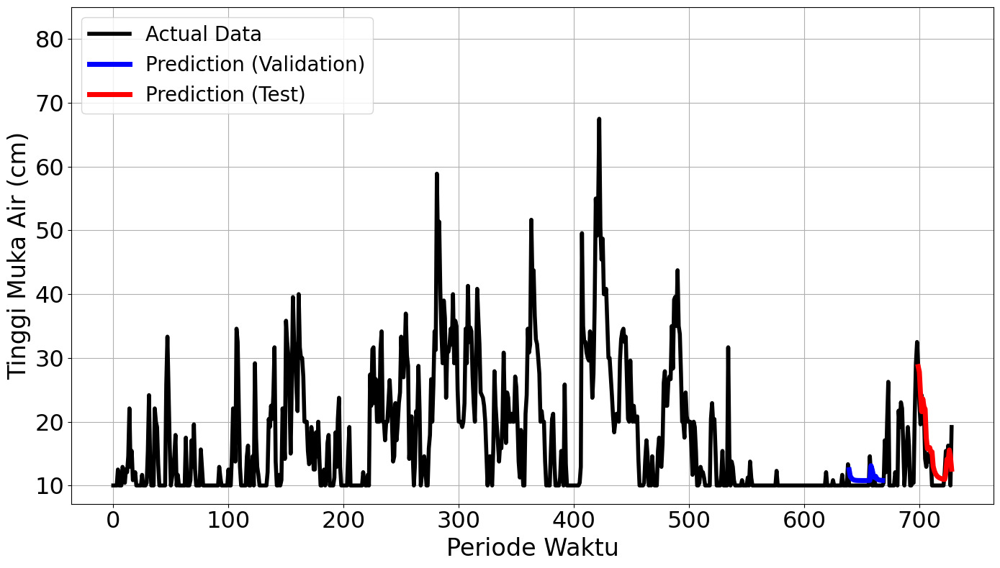

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
820/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


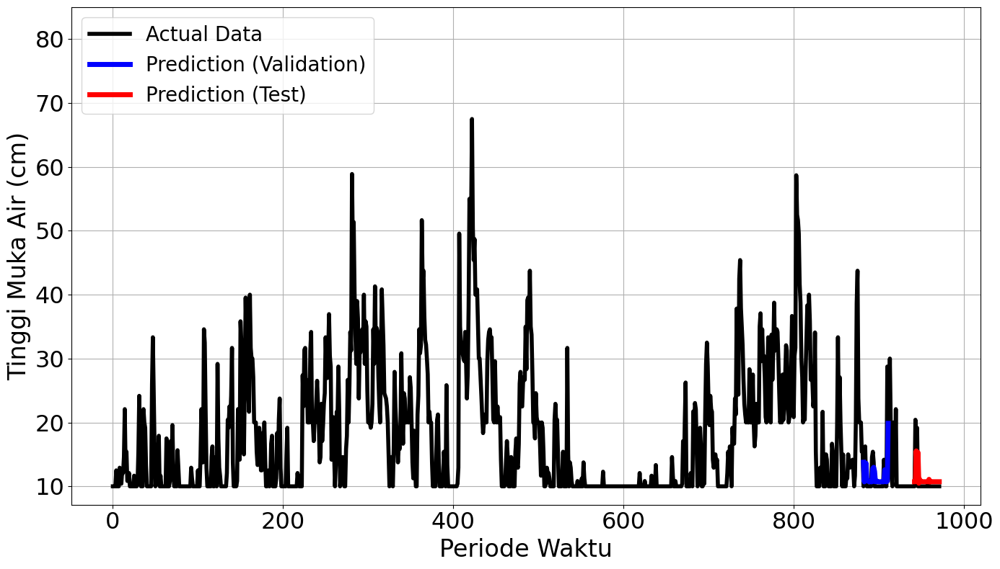

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1062/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━

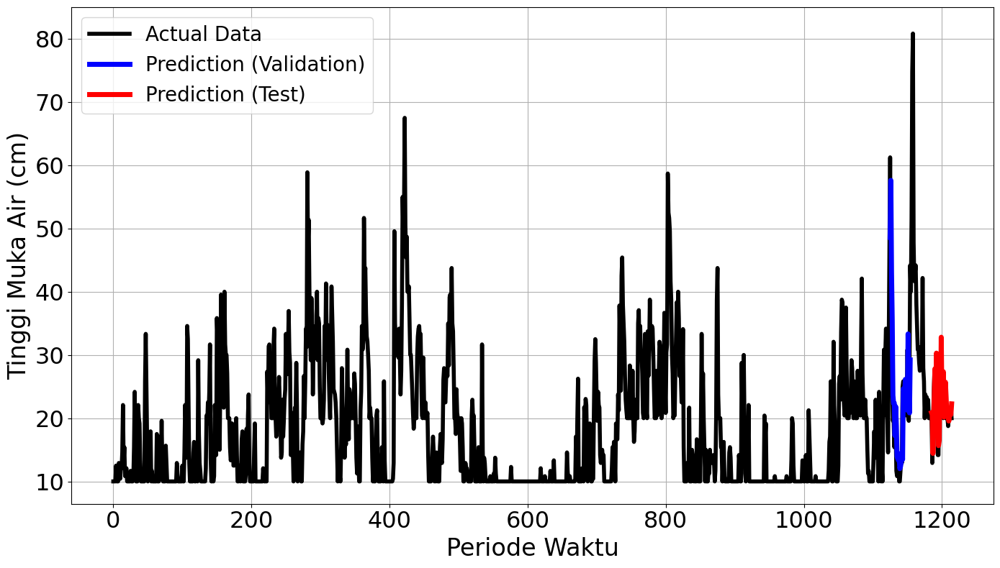

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


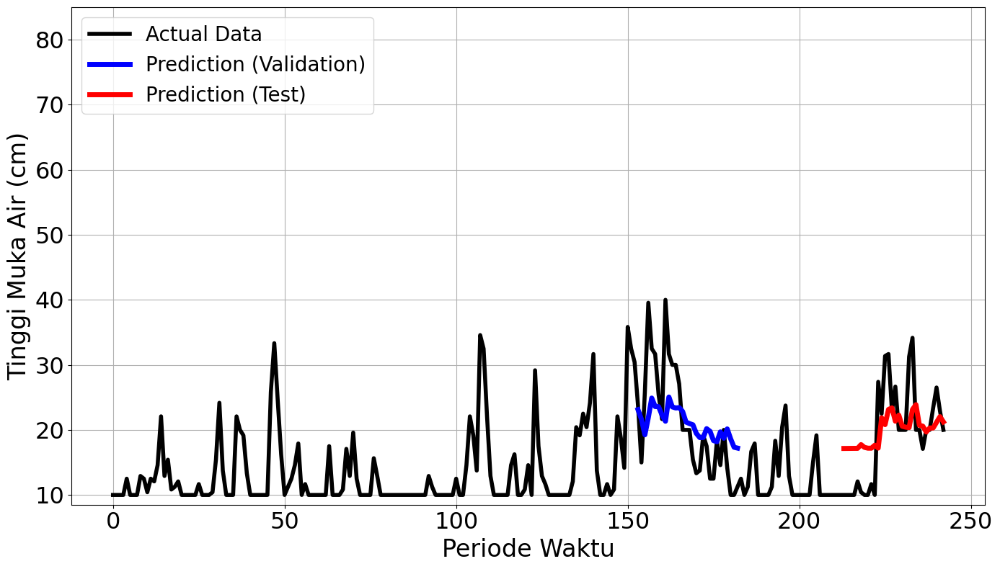

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
map

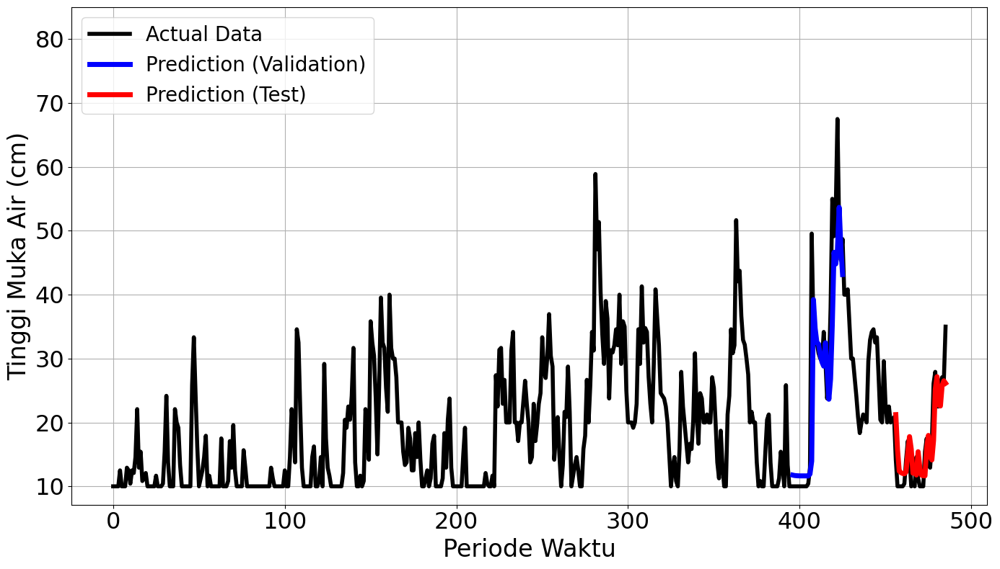

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
576/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


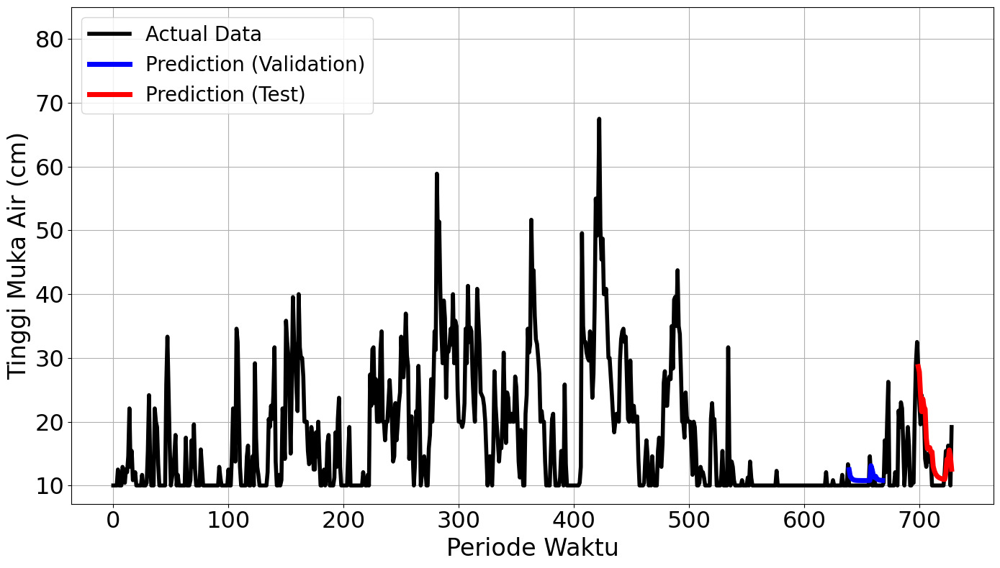

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
821/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
ma

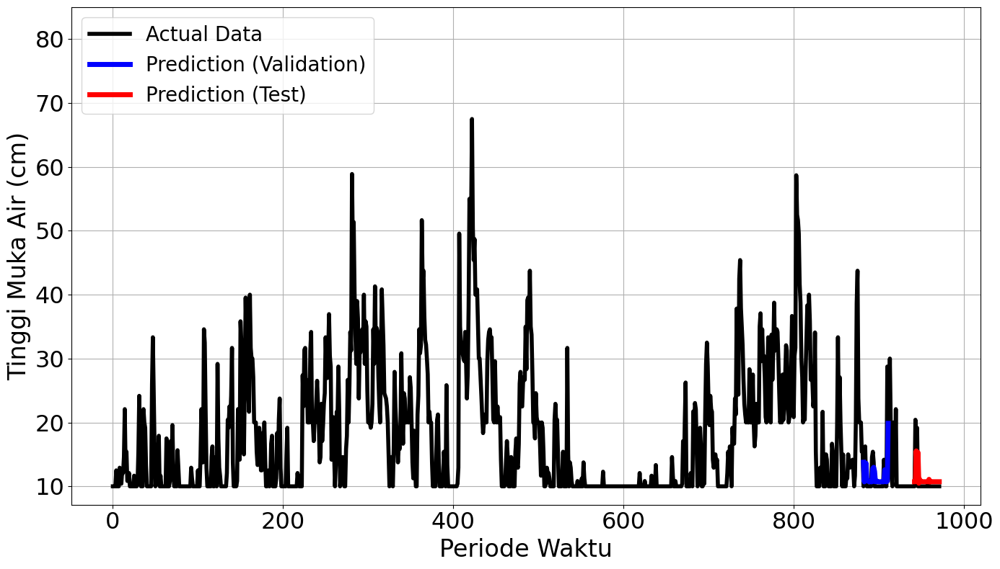

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━

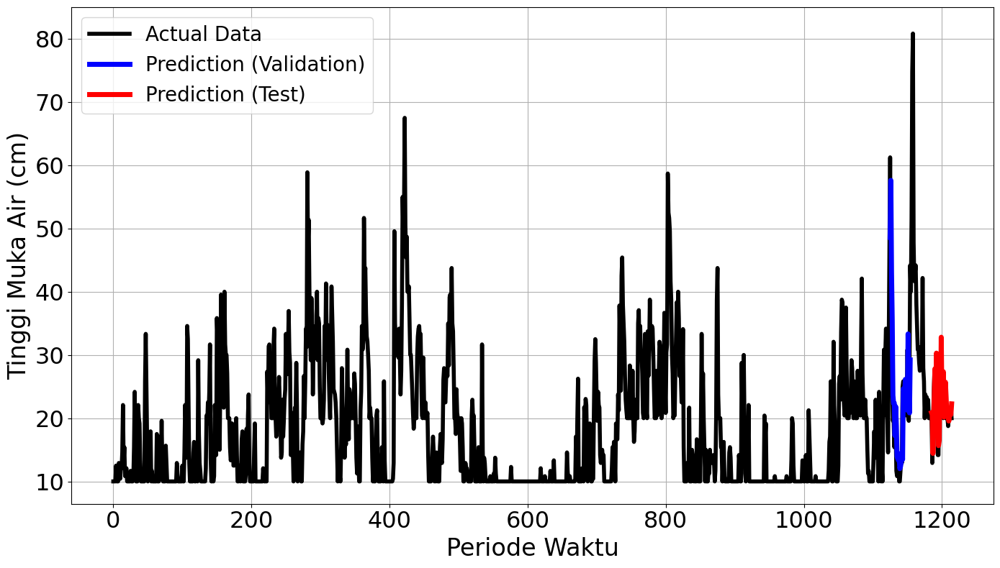

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
89/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


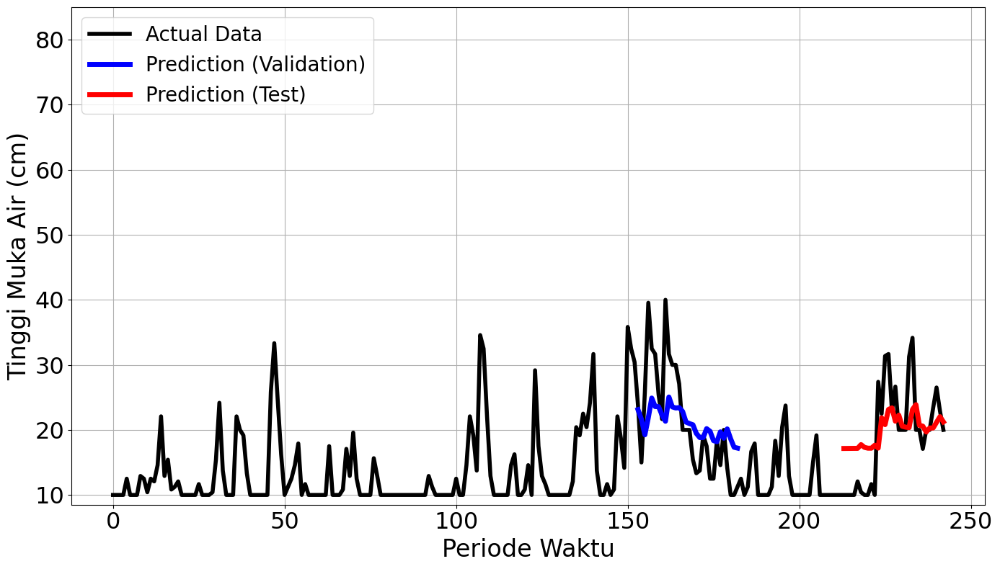

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
map

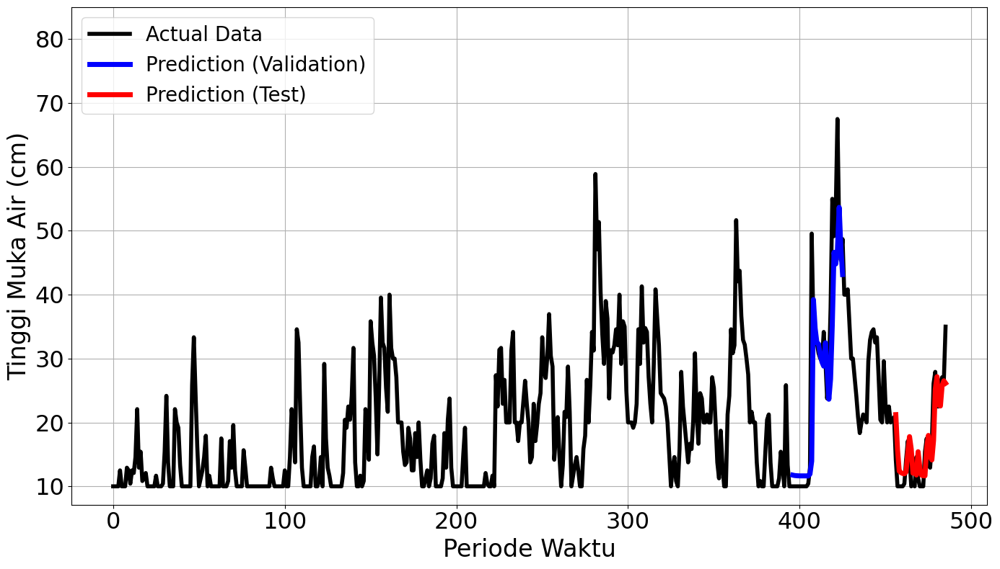

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
577/579 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


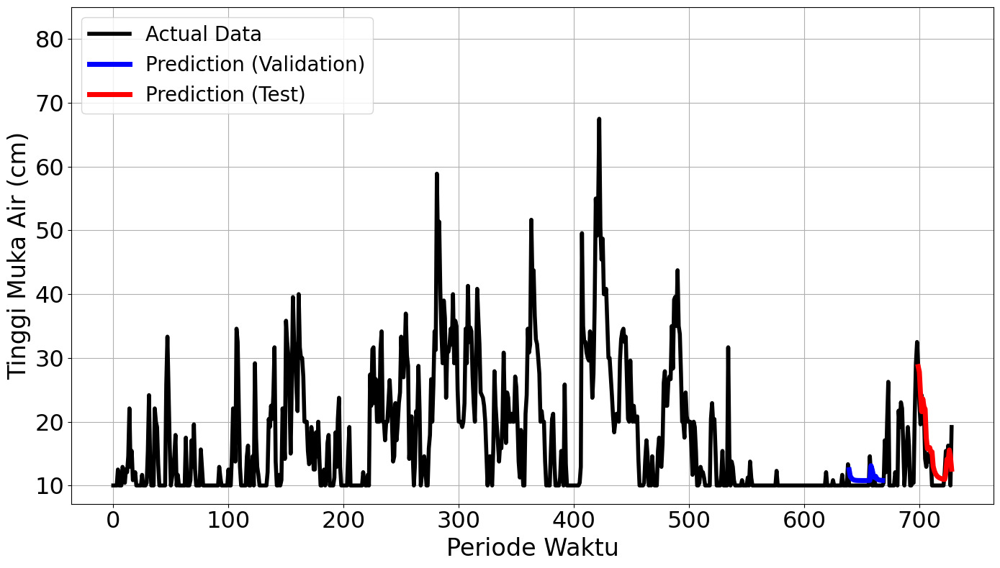

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
819/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
m

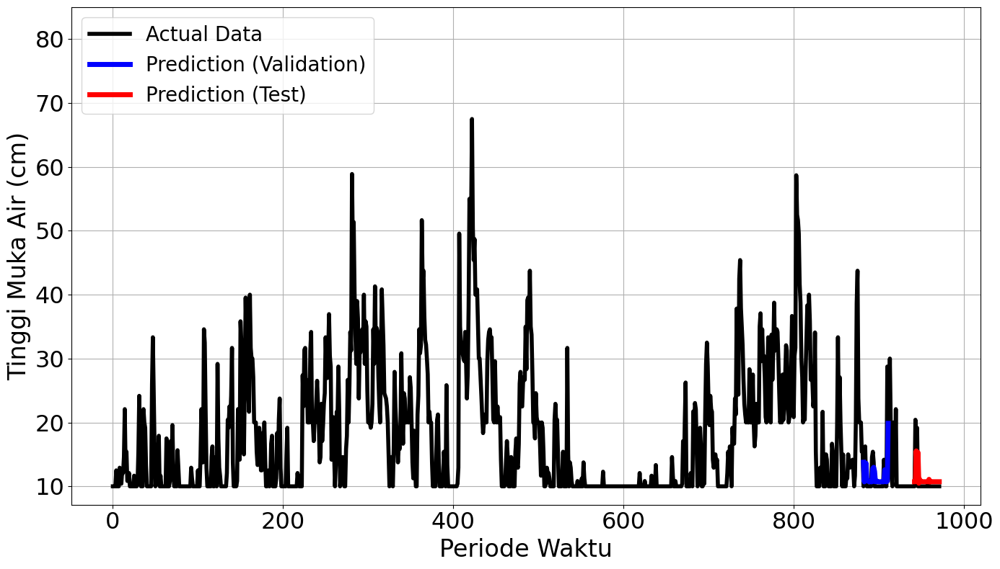

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━

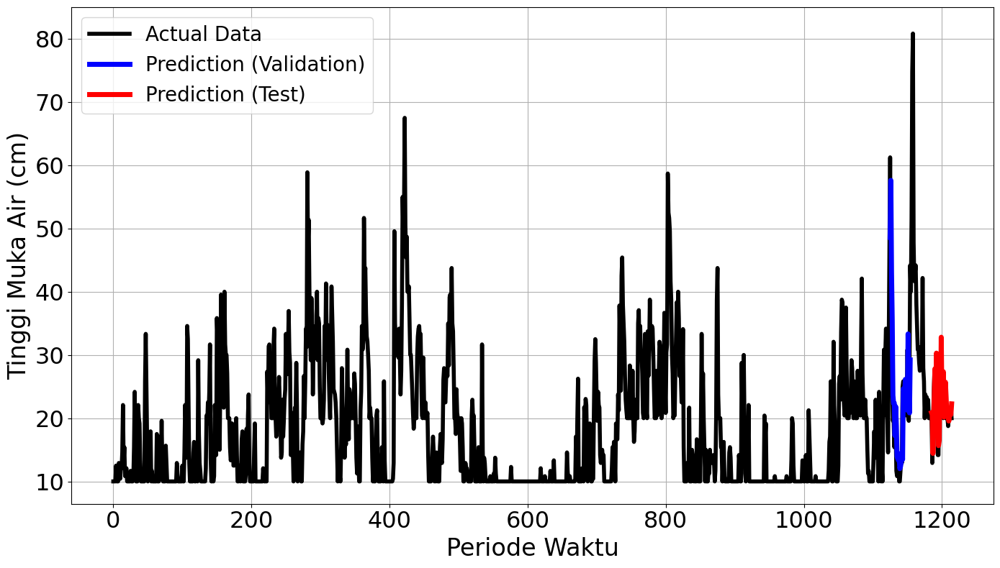

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
91/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


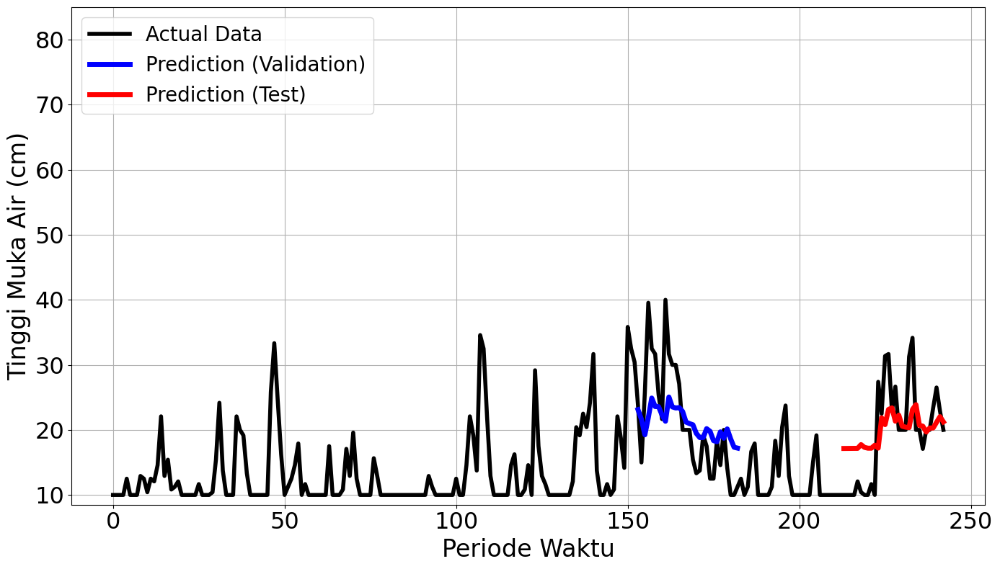

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
map

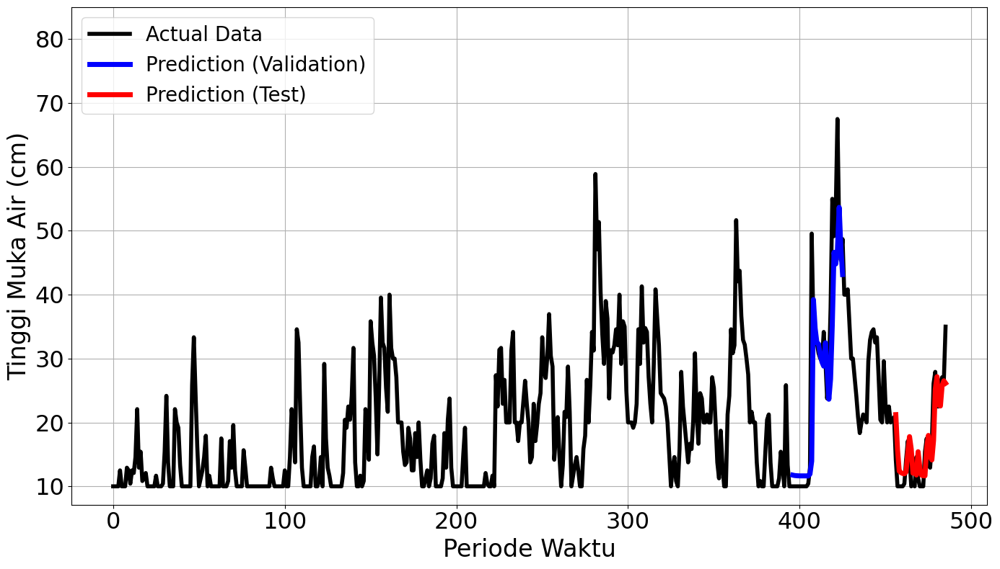

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
575/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


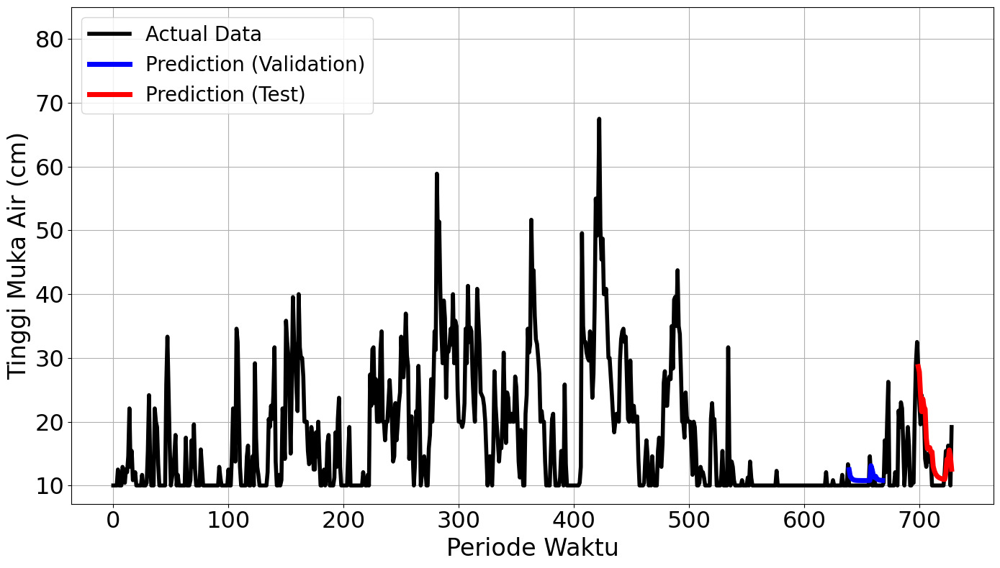

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
819/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
ma

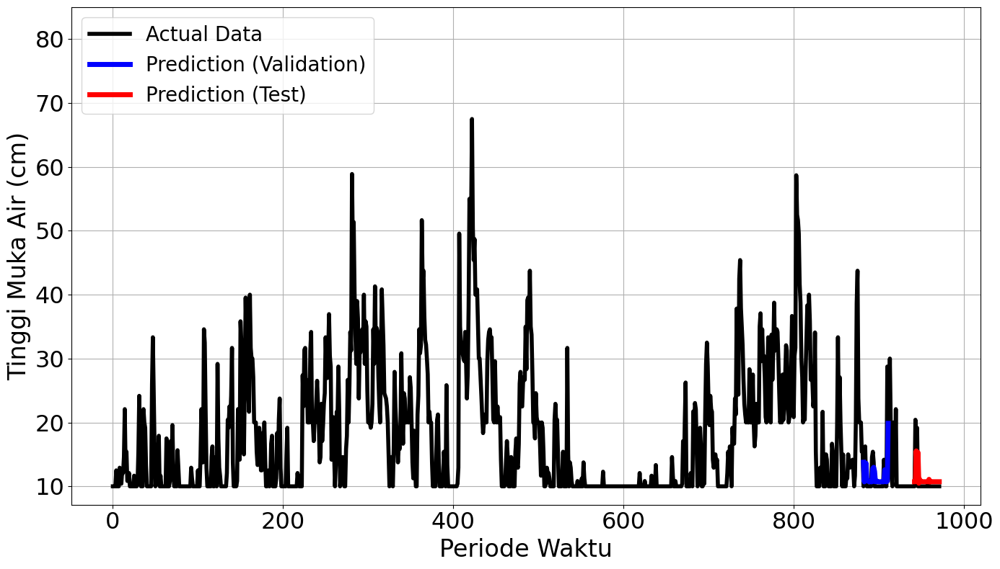

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1064/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━

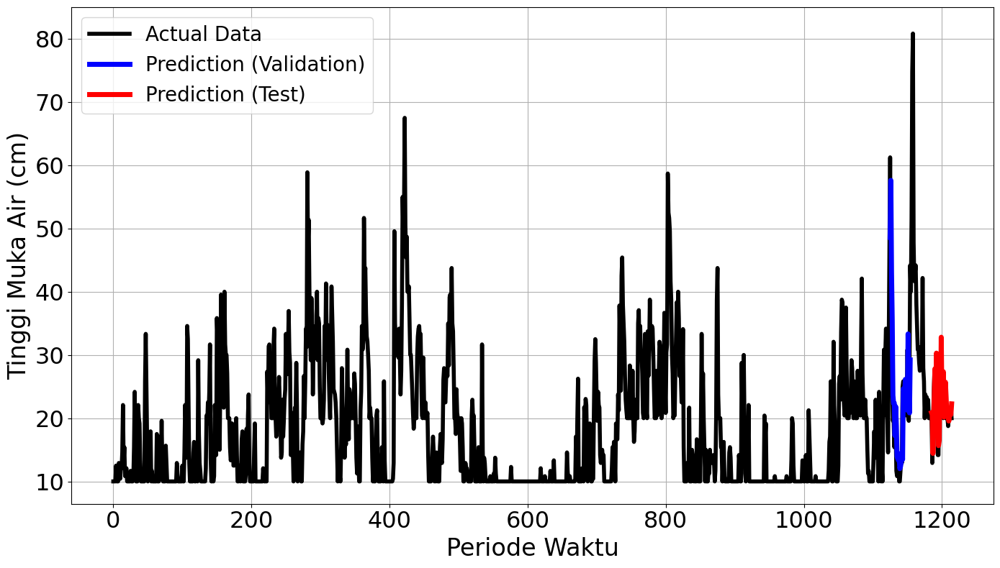

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


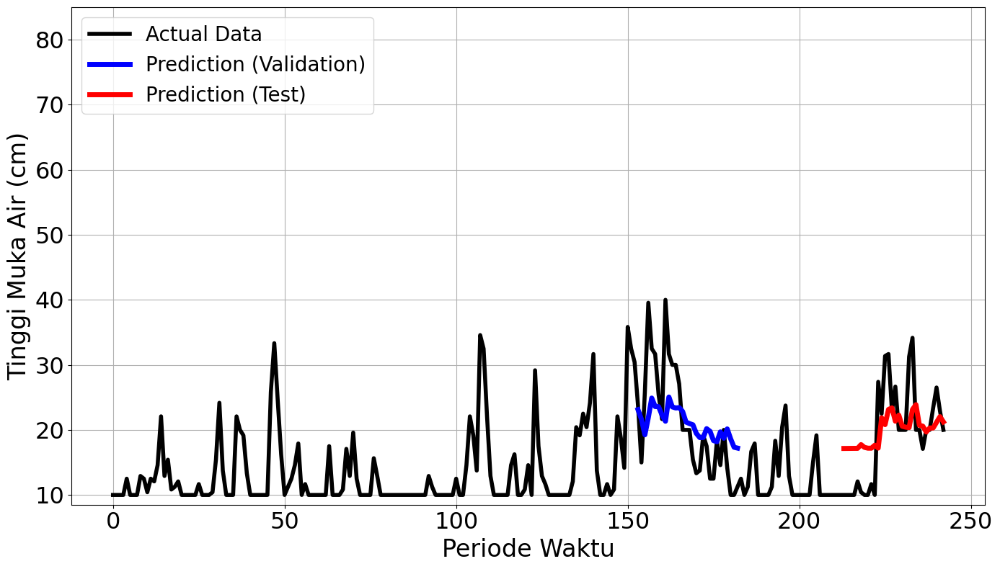

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
334/336 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
ma

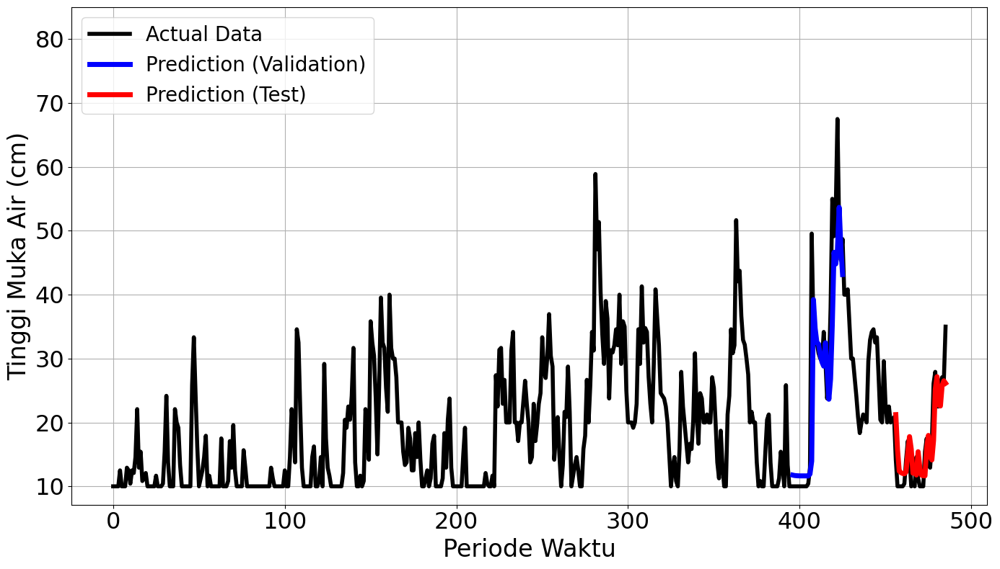

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
577/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


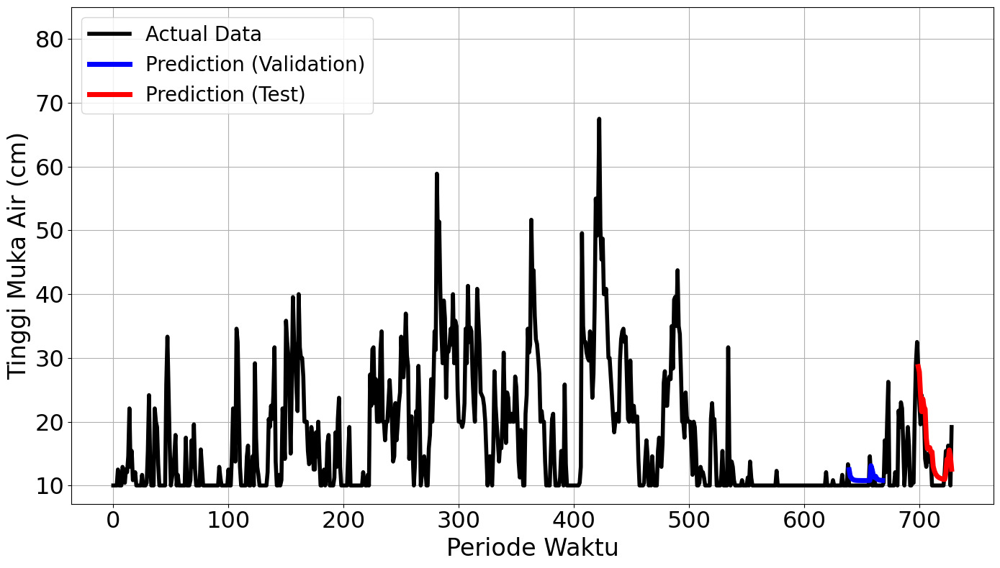

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
818/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
ma

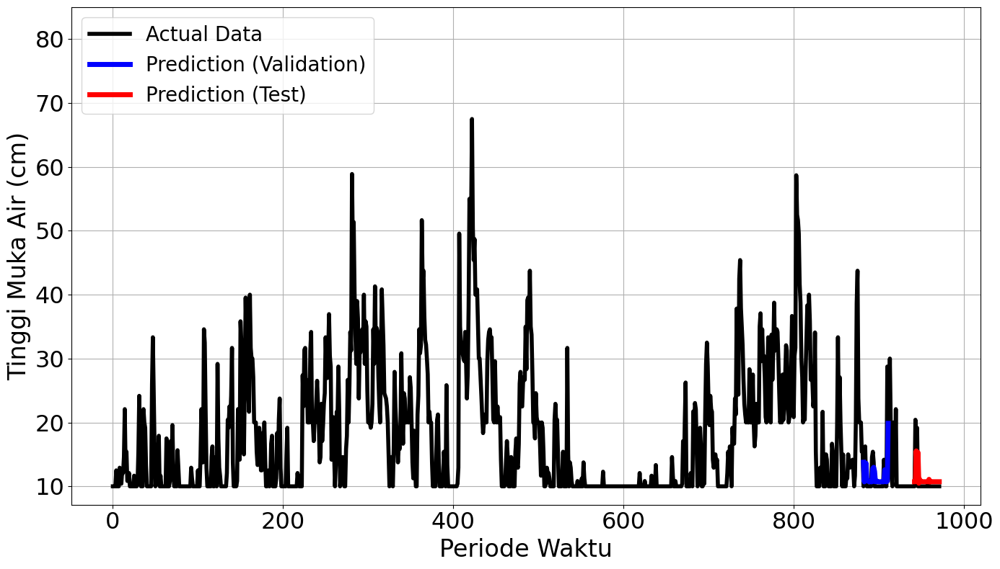

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1064/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━

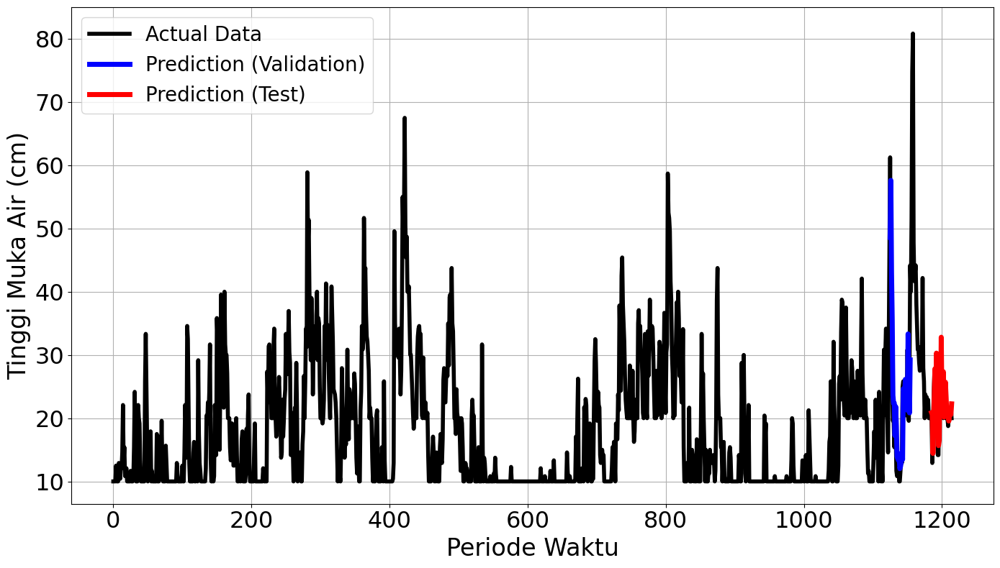

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


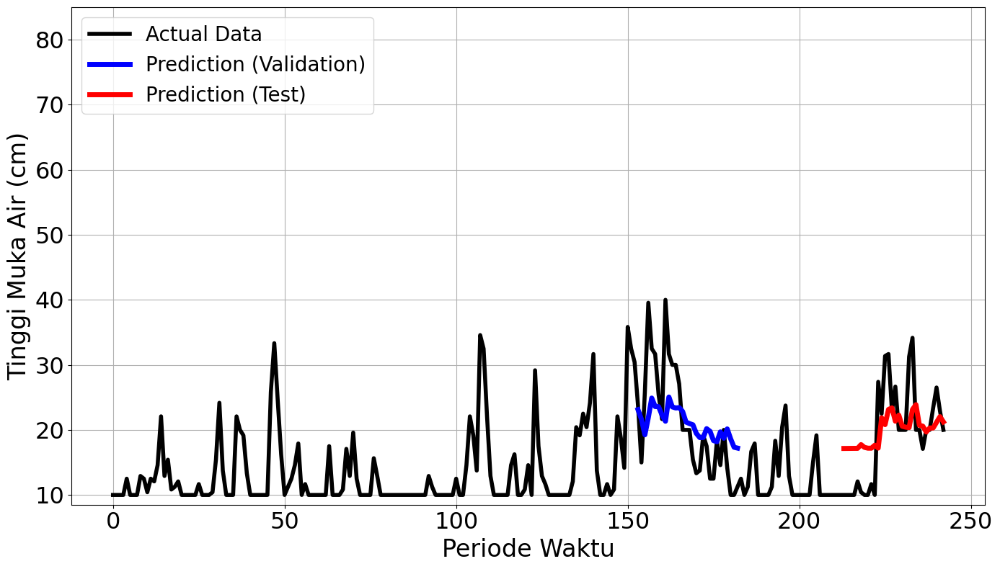

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
334/336 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
ma

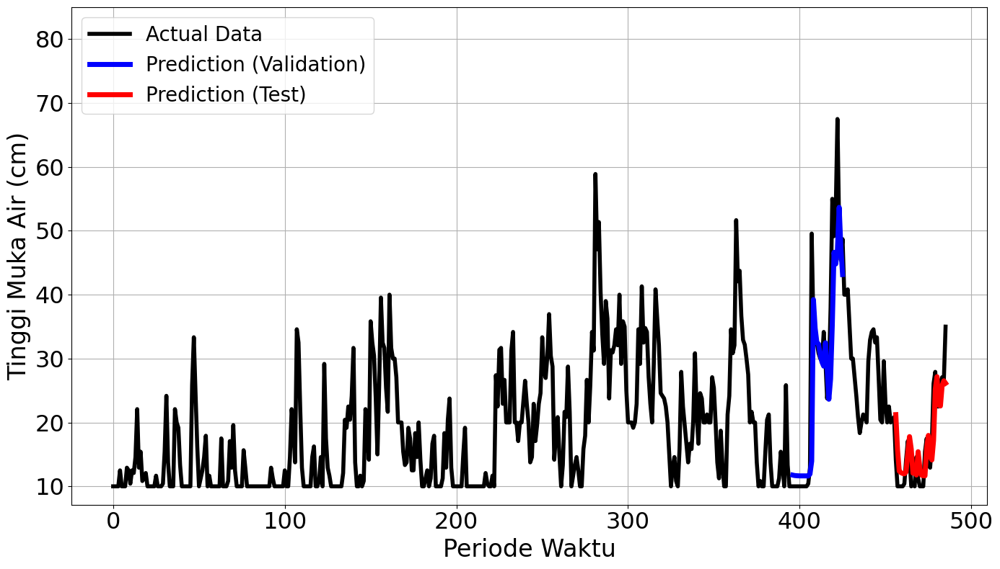

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
577/579 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


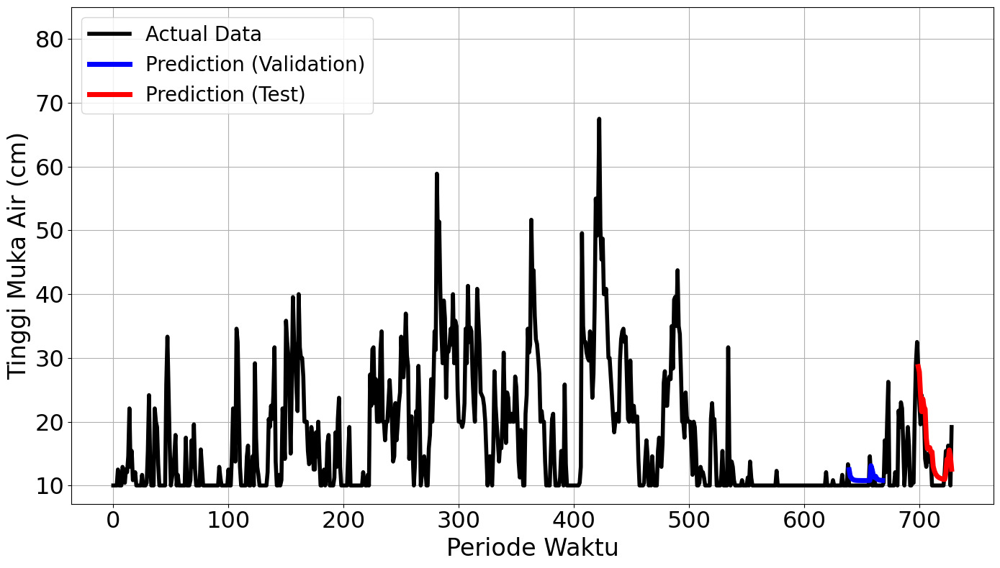

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
820/822 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
m

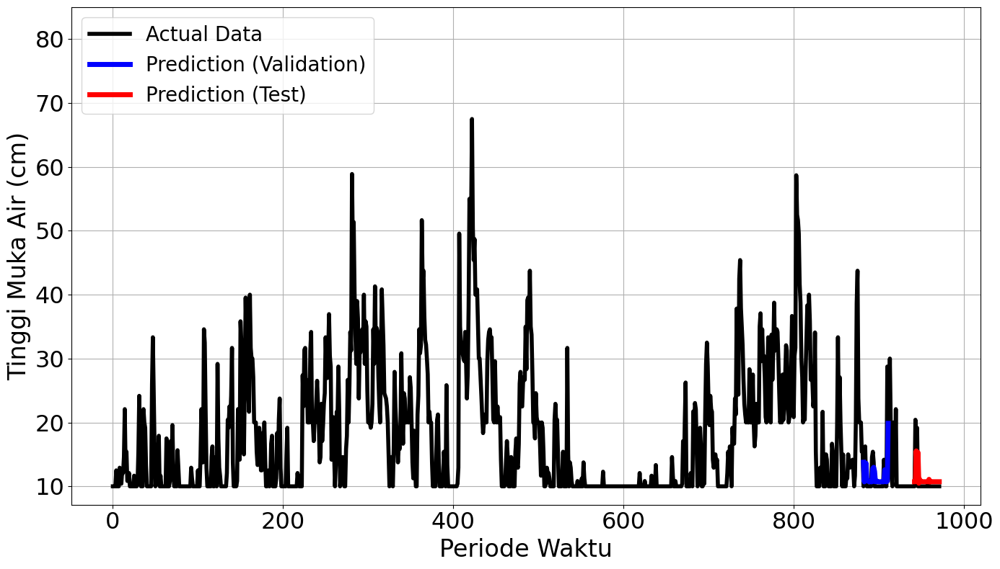

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1061/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━

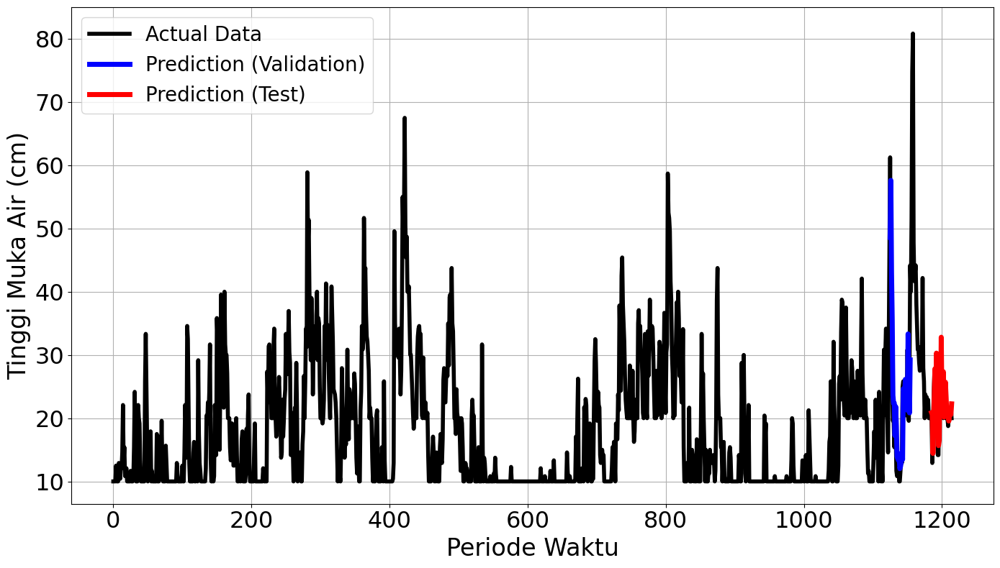

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


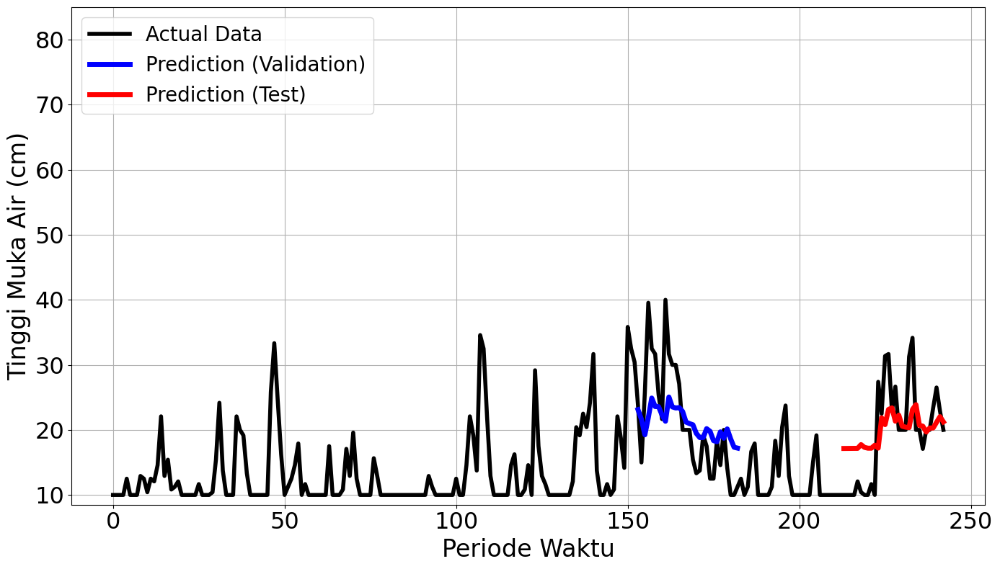

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
ma

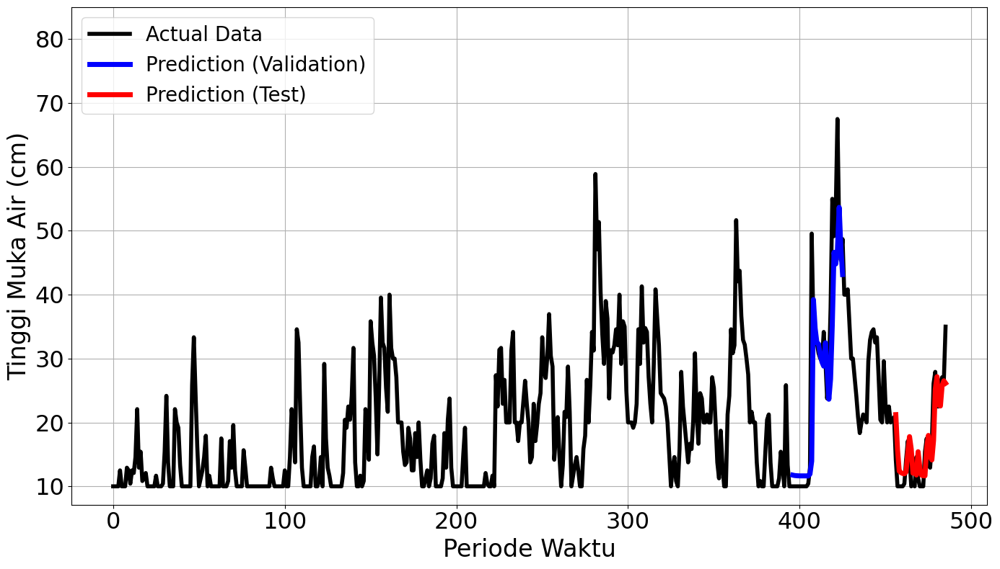

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
576/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


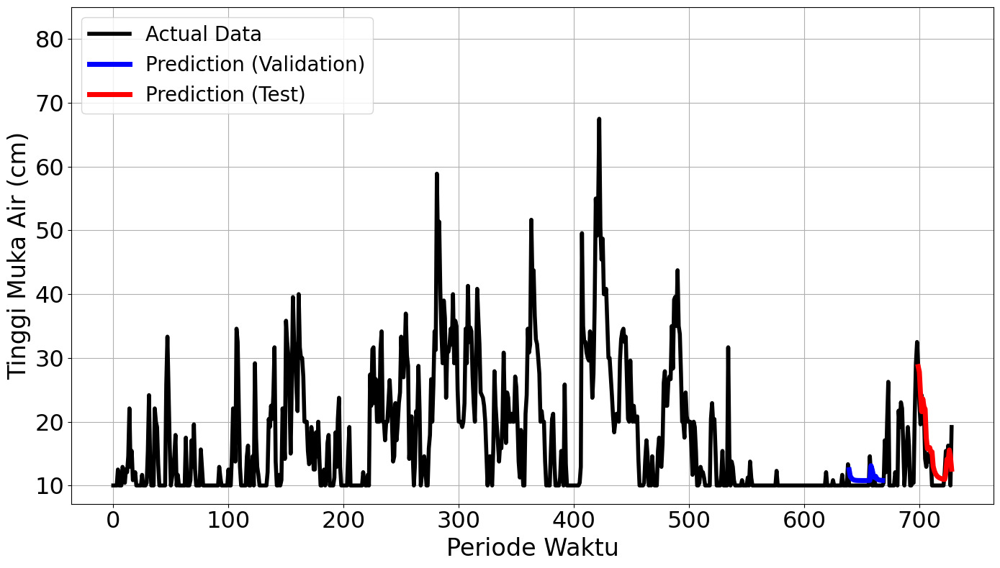

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
819/822 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
map

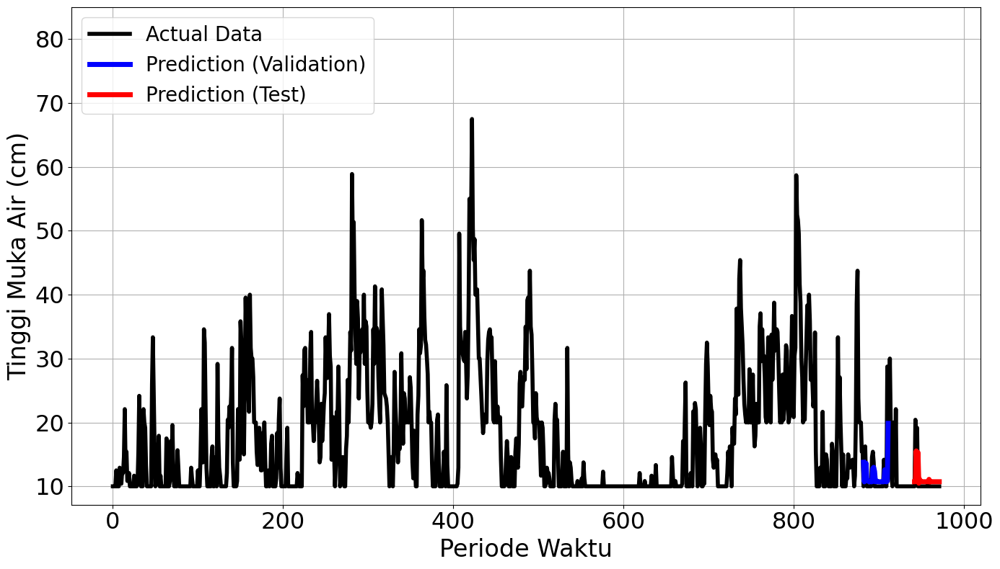

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 19s 9ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━

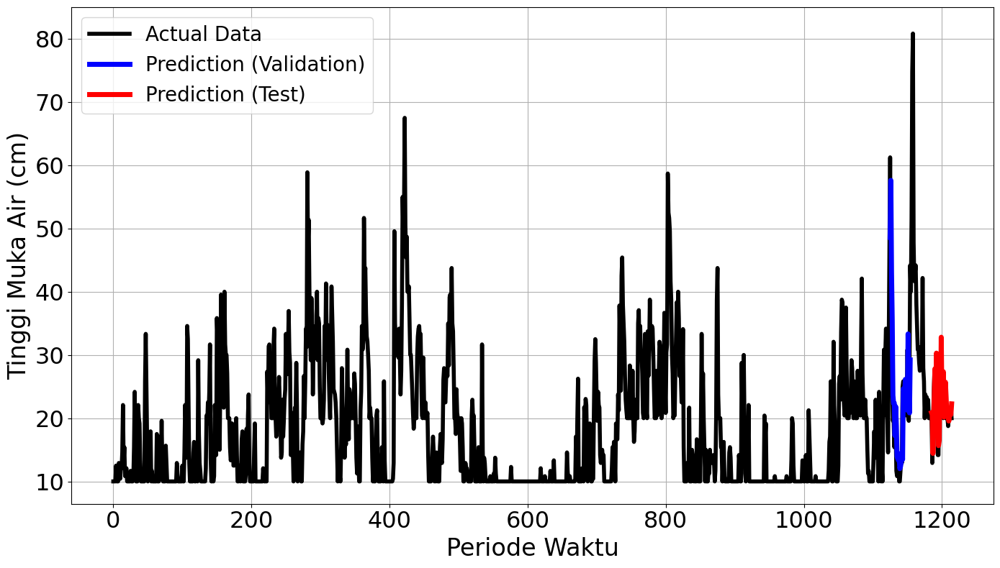

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0527 - val_loss: 0.0143
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0055 - val_loss: 0.0217
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0044 - val_loss: 0.0096
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0077 - val_loss: 0.0178
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0057 - val_loss: 0.0129
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0064 - val_loss: 0.0190
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0032 - val_loss: 0.0157
Epoch 8/100
90/93 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0033 - val_loss: 0.0338
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 28.760547192654585 %
mape test = 32.10590154682072 %


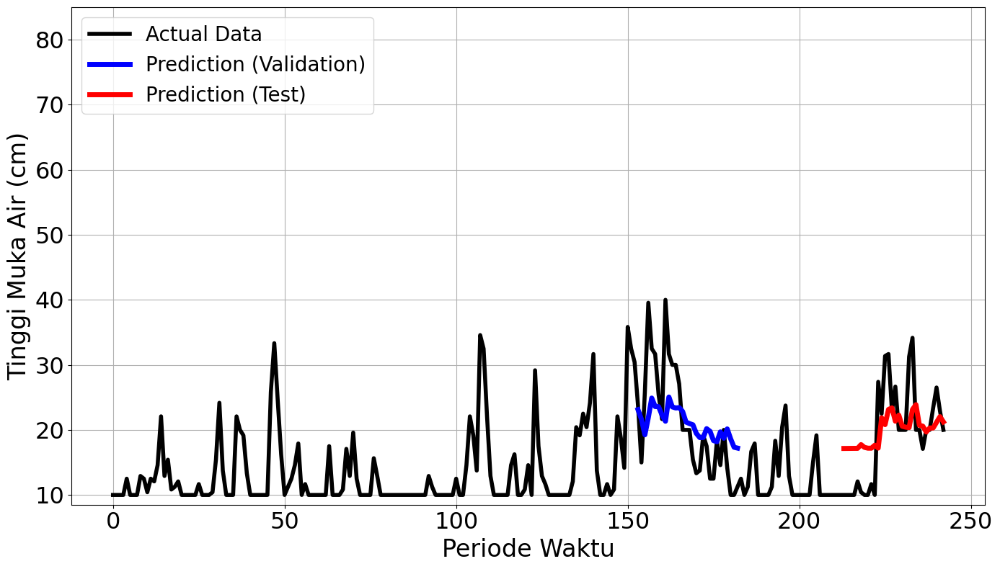

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0104 - val_loss: 0.0175
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.0083 - val_loss: 0.0173
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0082 - val_loss: 0.0162
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0079 - val_loss: 0.0306
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0095 - val_loss: 0.0288
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0078 - val_loss: 0.0239
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0066 - val_loss: 0.0282
Epoch 9/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.0068 - val_loss: 0.0177
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
ma

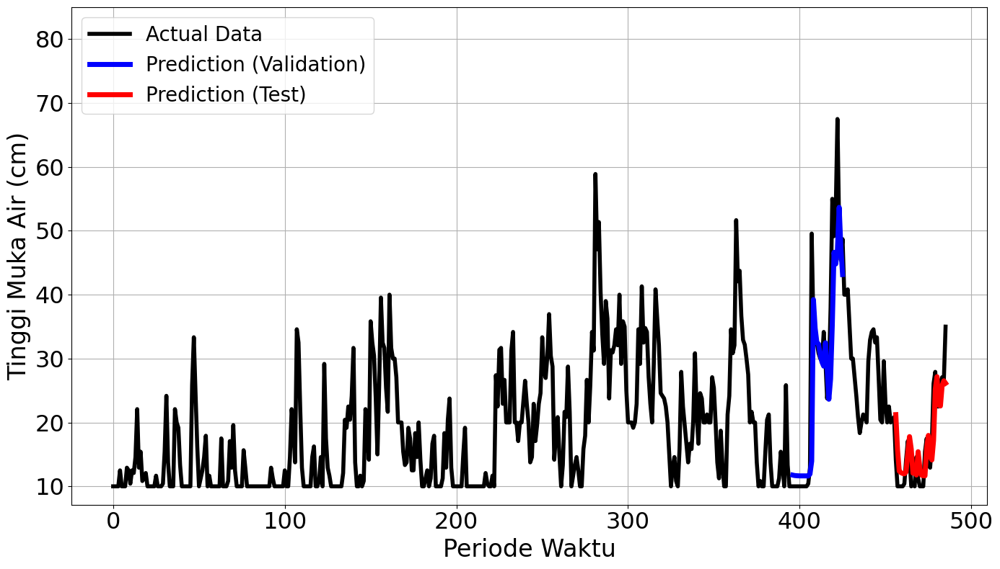

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0293 - val_loss: 3.4113e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0079 - val_loss: 0.0036
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0074 - val_loss: 0.0029
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0071 - val_loss: 0.0033
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0069 - val_loss: 5.4847e-04
Epoch 6/100
575/579 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071Restoring model weights from the end of the best epoch.
579/579 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0071 - val_loss: 6.3424e-04
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
mape validation = 10.69707644898455 %
mape test = 18.357268534113732 %


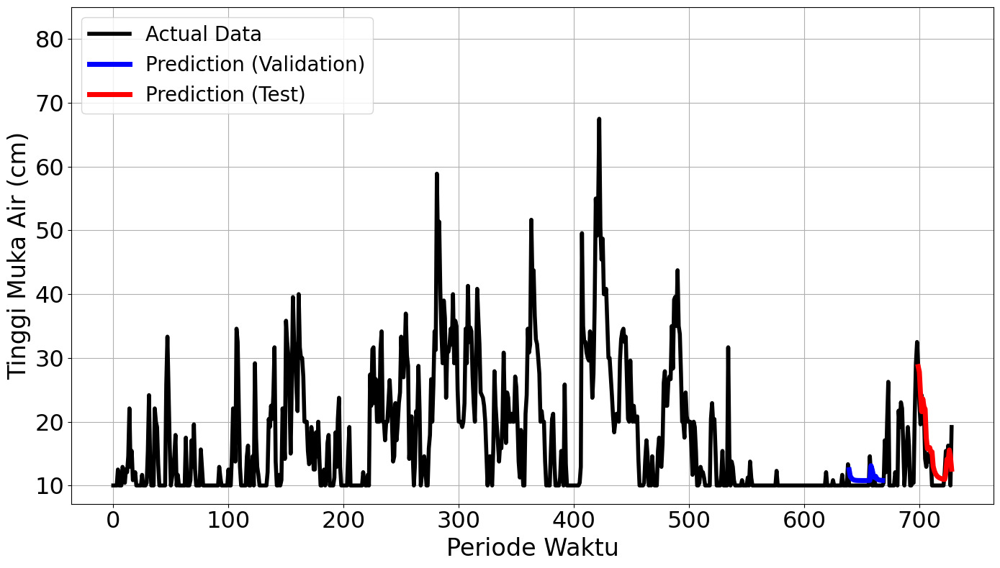

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0259 - val_loss: 0.0033
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0066 - val_loss: 0.0117
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0070 - val_loss: 0.0090
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0060 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0073 - val_loss: 0.0088
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 0.0074 - val_loss: 0.0040
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0070 - val_loss: 0.0047
Epoch 9/100
818/822 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0063 - val_loss: 0.0033
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/ste

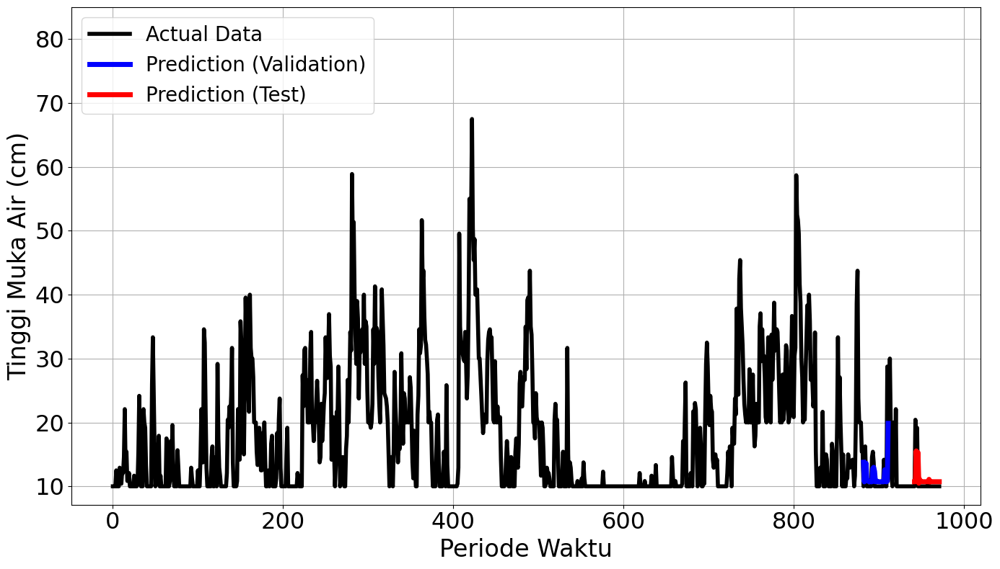

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - loss: 0.0215 - val_loss: 0.0123
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0064 - val_loss: 0.0100
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0066 - val_loss: 0.0085
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - loss: 0.0058 - val_loss: 0.0137
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0071 - val_loss: 0.0118
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0065 - val_loss: 0.0166
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 0.0063 - val_loss: 0.0090
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0055 - val_loss: 0.0090
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━

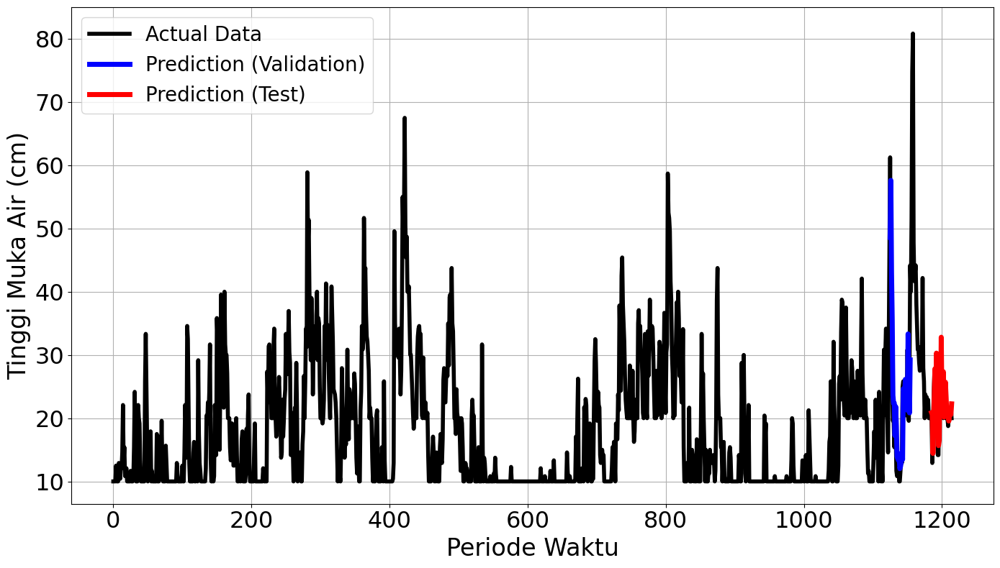

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1812
Final Average MAPE Test: 0.2030


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter expanding window
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [16, 32, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  # Simpan nilai asli
  base_n_train = n_train
  base_n_train_and_val = n_train_and_val

  for i in range(n_windows1):
    current_n_train = base_n_train + i * shift
    current_n_train_and_val = base_n_train_and_val + i * shift
    end = current_n_train_and_val + n_test

    if end > n_total:
        print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
        break

    window_data = data_series[:end]  # expanding window
    train_and_val = window_data[:current_n_train_and_val]
    train = train_and_val[:current_n_train]
    val = train_and_val[current_n_train:]
    test = window_data[current_n_train_and_val:]

    try:

          train_generator = TimeseriesGenerator(train, train, length = look_back, sampling_rate = 1, stride = 1, batch_size = 1)

          val_generator = TimeseriesGenerator(val, val, length = look_back, sampling_rate = 1, stride = 1, batch_size = 1)

          test_generator = TimeseriesGenerator(test, test, length = look_back, sampling_rate = 1, stride = 1, batch_size = 1)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=100, validation_data=val_generator, batch_size=bsize, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          mape_val = mean_absolute_percentage_error(val_actual[-len(val_generator):], val_predictions_descale)
          mape_test = mean_absolute_percentage_error(test_actual[-len(test_generator):], test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          X_actual = np.arange(len(train) + len(val) + len(test))
          X_val = np.arange(len(train) + look_back, len(train) + len(val))
          X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left') # legend untuk setiap subplot window
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

    except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # setelah proses looping selesai
  plt.tight_layout(rect=[0, 0, 1, 0.97])  # agar suptitle tidak ketiban
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (EWCV)

In [11]:
hyperparameter_summary = pd.DataFrame({
    "mape_vals" : average_mape_vals_by_param,
    "mape_tests" : average_mape_tests_by_param
})


hyperparameter_summary.sort_values("mape_tests")

,mape_vals,mape_tests
0,0.198724,0.198358
1,0.198724,0.198358
2,0.198724,0.198358
3,0.198724,0.198358
4,0.198724,0.198358
5,0.198724,0.198358
6,0.198724,0.198358
7,0.198724,0.198358
8,0.181184,0.202988
9,0.181184,0.202988


In [12]:
best_idx = int(hyperparameter_summary.sort_values("mape_tests").index[0])
best_idx

0

In [13]:
parameter_combinations = list(itertools.product(*list(config_params.values())))
best_parameter = parameter_combinations[best_idx]
best_param = dict()
for i, key in enumerate(config_params.keys()):
  best_param[key] = best_parameter[i]
best_param

{'learning_rate': 0.001,
 'batch_size': 16,
 'neurons': 50,
 'init_scheme': 'he_uniform'}

### Best Parameter (EWCV)

In [14]:
best_param = {'learning_rate': 0.001, 'batch_size': 16, 'neurons': 50, 'init_scheme': 'he_uniform'}

In [15]:
from tensorflow.keras.initializers import HeUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Tentukan skema inisialisasi bobot
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    else:
        raise ValueError("init_scheme yang didukung hanya: 'he_uniform'.")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(time_step, 1),
        kernel_initializer=initializer,
        recurrent_initializer=initializer
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [16]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

train_data = data.iloc[:1095]
val_data = data.iloc[1095:1155]
test_data = data.iloc[1155:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 1095
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'he_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=128,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/100
Epoch 3/100
Epoch 4/100
Epoch 5/100
Epoch 6/100
Epoch 7/100
Epoch 8/100
Epoch 9/100
Epoch 10/100
Epoch 11/100
Epoch 12/100
Epoch 13/100
Epoch 14/100
Epoch 15/100
Epoch 16/100
Epoch 17/100
Epoch 18/100
Epoch 19/100
Epoch 20/100
Epoch 21/100
Epoch 22/100
Epoch 23/100
Epoch 24/100
Epoch 25/100
Epoch 26/100
Epoch 27/100
Epoch 28/100
Epoch 29/100
Epoch 30/100
Epoch 31/100
Epoch 32/100
Epoch 33/100
Epoch 34/100
Epoch 35/100
Epoch 36/100
Epoch 37/100
Epoch 38/100
Epoch 39/100
Epoch 40/100
Epoch 41/100
Epoch 42/100
Epoch 43/100
Epoch 44/100
Epoch 45/100
Epoch 46/100
Epoch 47/100
Epoch 48/100
Epoch 49/100
Epoch 50/100
Epoch 51/100
Epoch 52/100
Epoch 53/100
Epoch 54/100
Epoch 55/100
Epoch 56/100
Epoch 57/100
Epoch 58/100
Epoch 59/100
Epoch 60/100
Epoch 61/100
Epoch 62/100
Epoch 63/100
Epoch 64/100
Epoch 65/100
Epoch 66/100
Epoch 67/100
Epoch 68/100
Epoch 69/100
Epoch 70/100
Epoch 71/100
Epoch 72/100
Epoch 73/100
Epoch 74/100
Epoch 75/100
Epoch 76/100
Epoch 77/100
Epoch 78/100
Epoch 7

### Plot Model Loss

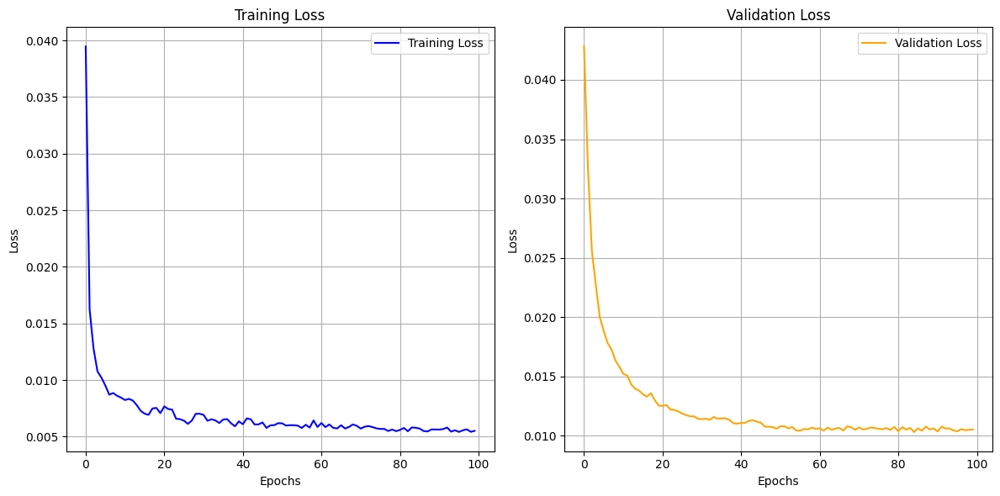

In [17]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

### MAPE Train

In [18]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [19]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


0.18535880112772757

### Plot Train Actual vs Predicted

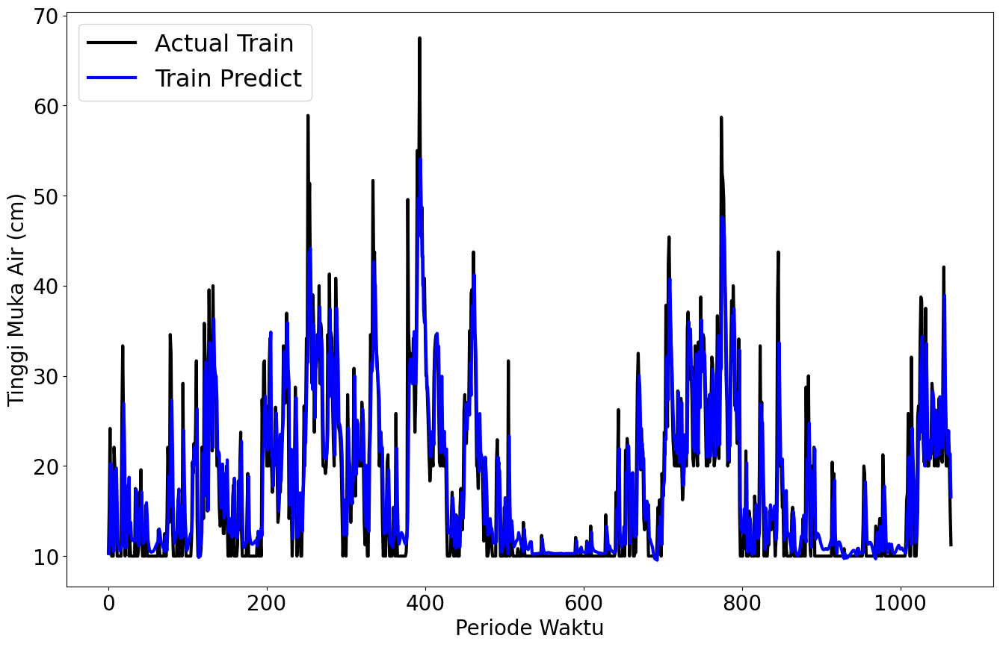

In [20]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'blue')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 23)
plt.show()